<span style='font-size: 24px;'><b>Импорт библиотек, настройки, константы, объявление функций</b><span>
<br>

Выполним установку необходимых библиотек.<br>
<i>(локально эти библиотеки стоят, комментирую код для ревьюера)</i>

In [1]:
# выполняю установку библиотек в "тихом" режиме
# ! pip install -q missingno
# ! pip install -q levenshtein
# ! pip install -q ydata-profiling
# ! pip install -q sweetviz
# ! pip install -q phik
# ! pip install -q optuna-integration
# ! pip install -q shap
# ! pip install ipywidgets

Импортируем библиотеки используемые в проекте.

In [2]:
# импортирую библиотеки
import numpy as np
import pandas as pd
import os
import missingno as msno
import math
import matplotlib.pyplot as plt
import seaborn as sns
from Levenshtein import distance as lev
from scipy import stats as st
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.linear_model import LogisticRegression
# from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.dummy import DummyClassifier
from IPython.display import display
import warnings

import phik
from phik.report import plot_correlation_matrix
import sweetviz as sv
from optuna.integration import OptunaSearchCV
from optuna import distributions
import shap
from ydata_profiling import ProfileReport

Выполним настройки и зададим константы.

In [3]:
# задаю настройки
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.options.display.float_format ='{:,.2f}'.format
sns.set_theme(style='whitegrid', palette='pastel')
sns.set_context(
    'notebook', 
    rc={
        'font.size':12,
        'axes.titlesize':16,
        'axes.labelsize':12,
        'legend.fontsize':12,
        'figure.figsize':(14, 7)
    }
)
# warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None

# задаю класс для стилизации вывода метода .print()
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

# создаю константу для фиксации объектов тренировочной и тестовой выборок
RANDOM_STATE = 42

# создаю константу для пропорционального разделения
# датасета на тренировочныую и тестовую выборки
TEST_SIZE = 0.25

## Загрузка файлов с данными

Загрузим 2 имеющихся файла в проект. Зададим имя для каждого датафрейма и сформируем кортеж из датафреймов.

In [4]:
# задаю пути к файлам
path1 = 'datasets/kaggle_startups_train_28062024.csv'
path2 = 'datasets/kaggle_startups_test_28062024.csv'

# загружаю файлы
if os.path.exists(path1) and os.path.exists(path2):
    df_train = pd.read_csv(path1, parse_dates=['founded_at', 'first_funding_at', 'last_funding_at'])
    df_test = pd.read_csv(path2, parse_dates=['first_funding_at', 'last_funding_at'])
else:
    print('Something is wrong!')

# задаю имена датафреймам
df_train.columns.name = 'df_train'
df_test.columns.name = 'df_test'

# создаю кортеж из имеющихся наименований датафреймов
df_tuple = (df_train, df_test)

Удостоверимся, что данные прочитаны верно, выведем на экран и изучим датафреймы.

In [5]:
# вывожу при помощи цикла первичные данные о датафреймах
print()
for df in df_tuple:
    print(color.BLUE + color.BOLD + f'Ознакомление с датафреймом "{df.columns.name}":' + color.END)
    display(df.sample(5))
    print()
    df.info()
    print('=' * 105, end='\n' * 3)


Ознакомление с датафреймом "df_train":


df_train,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
2126,Gazelle Semiconductor,Semiconductors,"500,000.00",operating,USA,CA,SF Bay Area,San Carlos,1,2013-01-01,2013-12-31,2013-12-31,NaN
44375,"MajorWeb, LLC",Information Technology|Software|University Students,"25,000.00",operating,USA,WI,Milwaukee,Milwaukee,1,2013-08-13,2014-08-22,2014-08-22,NaN
29565,Big Fish Communications,Email,"6,500,000.00",operating,USA,CA,Los Angeles,Marina Del Rey,1,2002-06-15,2002-12-24,2002-12-24,NaN
45075,ABB Road,Software,NaN,operating,USA,AL,AL - Other,Chatom,1,2010-01-15,2014-10-13,2014-10-13,NaN
8674,Djump,Apps|Chat|Music,NaN,operating,BEL,11,Brussels,Brussels,1,2013-07-14,2014-08-04,2014-08-04,NaN



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               52515 non-null  object        
 1   category_list      50051 non-null  object        
 2   funding_total_usd  42447 non-null  float64       
 3   status             52516 non-null  object        
 4   country_code       47014 non-null  object        
 5   state_code         45753 non-null  object        
 6   region             46157 non-null  object        
 7   city               46157 non-null  object        
 8   funding_rounds     52516 non-null  int64         
 9   founded_at         52516 non-null  datetime64[ns]
 10  first_funding_at   52516 non-null  datetime64[ns]
 11  last_funding_at    52516 non-null  datetime64[ns]
 12  closed_at          4917 non-null   object        
dtypes: datetime64[ns](3), float64(1), int64(1), object(8)
memory

df_test,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime
8194,MobileAds,Advertising,NaN,MYS,9,Penang,Penang,1,2014-06-10,2014-06-10,2192
9262,Leaducate,All Students|Education|Marketplaces|Services,NaN,ARG,1,ARG - Other,Olivos,1,2014-11-10,2014-11-10,4140
10475,WINGIT,Internet,"2,473,563.00",FRA,A8,Paris,Paris,1,2015-06-15,2015-06-15,2192
8708,Betaout,Enterprise Software|SaaS,"618,000.00",USA,NY,New York City,New York,2,2015-07-06,2015-08-13,1794
11549,Wiener Games,Games,"121,695.91",BGR,NaN,NaN,NaN,3,2013-05-01,2015-06-01,2199



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               13125 non-null  object        
 1   category_list      12534 non-null  object        
 2   funding_total_usd  10547 non-null  float64       
 3   country_code       11743 non-null  object        
 4   state_code         11430 non-null  object        
 5   region             11536 non-null  object        
 6   city               11538 non-null  object        
 7   funding_rounds     13125 non-null  int64         
 8   first_funding_at   13125 non-null  datetime64[ns]
 9   last_funding_at    13125 non-null  datetime64[ns]
 10  lifetime           13125 non-null  int64         
dtypes: datetime64[ns](2), float64(1), int64(2), object(6)
memory usage: 1.1+ MB




Выведенные произвольные строки для всех датафреймов показывают, что данные загружены верно и значения корректно распределены по столбцам. Cтолбцы с датами в датафрейме типизированы верно, за исключением колонки 'closed_at' в тренировочных данных. Разберёмся с этим в следующих шагах. Нет столбцов с неверными десятичными разделителями.

Датафрейм `df_train` состоит из 52 514 строк и 13 столбцов, имеет колонки с пропусками.<br>
Датафрейм `df_test` состоит из 13 125  строк и 12 столбцов, имеет колонки с пропусками.<br>

Замечено, что в датафрейме `df_train` есть колонка 'closed_at' а в `df_test` она отсутствует и добавлена 'lifetime'. Постараемся привести признаки тренировочных и тестовых данных к единообразию в следующих шагах.

Для дальнейшей оценки размера обработанных данных, сохраним первоначальные значения формы датасетов в переменные.

In [6]:
# создаю переменные и сохраняю размер пяти датафреймов
df_train_shape = df_train.shape
df_test_shape = df_test.shape

## Предобработка данных

### Наименование столбцов

Наименования колонок соответствуют правилам и не требуют изменений.

### Пропуски

Первичное ознакомление с данными выявило наличие пропусков.<br>
Отобразим ситуацию с отсутствующими значениями.

In [7]:
# создаю списки с количеством и долями пропусков в каждом датафрейме
for df in df_tuple:
    empty_qty = []
    empty_part = []
    for col in df.columns:
        empty_qty.append(df[col].isna().sum())
        empty_part.append(round(df[col].isna().sum() / df.shape[0] * 100, 2))
        globals()['na_q_' + str(df.columns.name)] = empty_qty
        globals()['na_p_' + str(df.columns.name)] = empty_part
    
# вывожу на экран таблицу с результатами для df_train
print(color.BLUE + color.BOLD + 'Количество и доля пропусков в признаках датафрейма "df_train":' + color.END + '\n')
display(pd.DataFrame(
        data={
            'Количество': na_q_df_train,
            'Доля, %': na_p_df_train
        }, 
        index=df_train.columns)
       )
print()

# вывожу на экран таблицу с результатами для df_test
print(color.BLUE + color.BOLD + 'Количество и доля пропусков в признаках датафрейма "df_test":' + color.END + '\n')
display(pd.DataFrame(
        data={
            'Количество': na_q_df_test,
            'Доля, %': na_p_df_test
        }, 
        index=df_test.columns)
       )

Количество и доля пропусков в признаках датафрейма "df_train":



,Количество,"Доля, %"
df_train,,
name,1,0.00
category_list,2465,4.69
funding_total_usd,10069,19.17
status,0,0.00
country_code,5502,10.48
state_code,6763,12.88
region,6359,12.11
city,6359,12.11
funding_rounds,0,0.00



Количество и доля пропусков в признаках датафрейма "df_test":



,Количество,"Доля, %"
df_test,,
name,0,0.00
category_list,591,4.50
funding_total_usd,2578,19.64
country_code,1382,10.53
state_code,1695,12.91
region,1589,12.11
city,1587,12.09
funding_rounds,0,0.00
first_funding_at,0,0.00


Визуализируем пропуски в обоих датафреймах.

Матрица пропусков для датаферйма df_train:



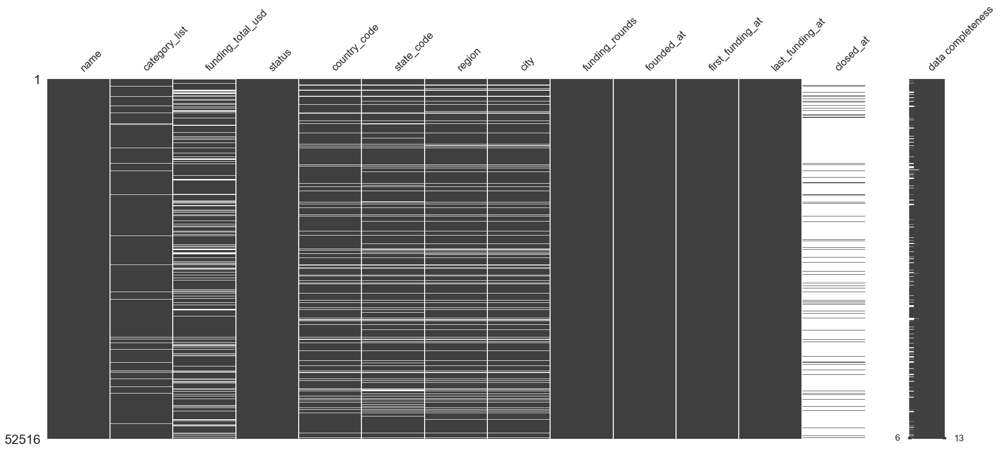

In [8]:
# применияю библиотеку missingno для визуализации пропусков в датафрейме "df_train"
print(color.BLUE + color.BOLD + 'Матрица пропусков для датаферйма df_train:' + color.END + '\n')
msno.matrix(df_train, labels=True)
pass

Матрица пропусков для датаферйма df_test:



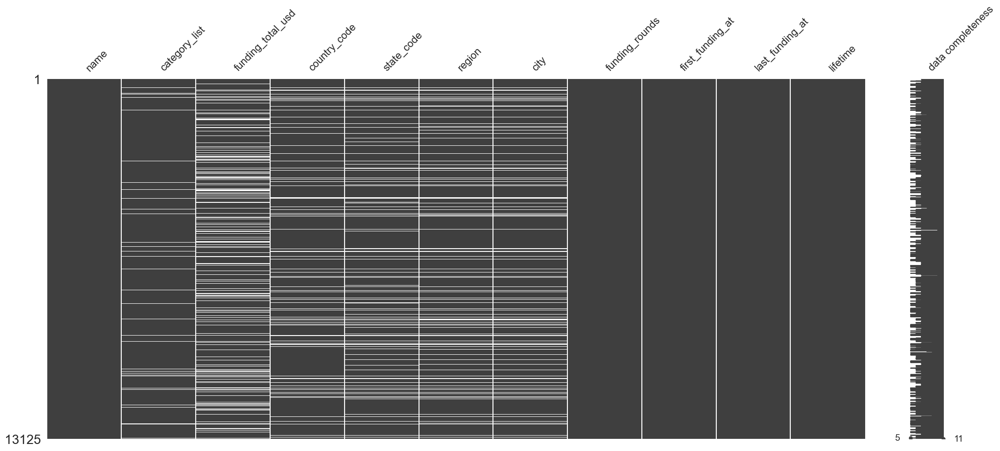

In [9]:
# применияю библиотеку missingno для визуализации пропусков в датафрейме "df_test"
print(color.BLUE + color.BOLD + 'Матрица пропусков для датаферйма df_test:' + color.END + '\n')
msno.matrix(df_test, labels=True)
pass

Исходя из визуализации пропусков нельзя обнаружить какой-то характерной закономерности, которую стоит указать инженерам данных. Можно отметить, что в иерархии признаков Country >> State >> Region >> City, если вышестоящий признак имеет пропуск, то и нижестоящие также не имеют значения.

Для решения задачи машинного обучения необходимо избавиться от каких-либо пропусков в данных. Выбирая стратегию удаления объектов с пропусками, получаем исключение существенной части тренировочных данных (30% без учёта пропусков в колонке `closed_at`). Пойдём путём замены пропусков на значения-"заглушки". 

В пропуски колонки `closed_at`подставим дату выгрузки датасета из базы данных - '2018-01-01'. 

Отсутствующие значения признака `funding_total_usd` могут означать, что стартап вообще не собрал средств. Однако, в колонке `funding_rounds` нет пропусков и нет значений 0, т.е. как минимум единожды стартапы были проинвестированы. Поэтому заменим пропуски медианным значением, сгруппированным по признаку `funding_rounds`.

In [10]:
# выполняю замену пропусков для df_train
df_train['name'] = df_train['name'].fillna('no_name')
df_train['category_list'] = df_train['category_list'].fillna('no_category')
df_train['country_code'] = df_train['country_code'].fillna('no_country')
df_train['state_code'] = df_train['state_code'].fillna('no_state')
df_train['region'] = df_train['region'].fillna('no_region')
df_train['city'] = df_train['city'].fillna('no_city')
df_train['closed_at'] = df_train['closed_at'].fillna('2018-01-01')

# выполняю замену пропусков для df_test
df_test['category_list'] = df_test['category_list'].fillna('no_category')
df_test['country_code'] = df_test['country_code'].fillna('no_country')
df_test['state_code'] = df_test['state_code'].fillna('no_state')
df_test['region'] = df_test['region'].fillna('no_region')
df_test['city'] = df_test['city'].fillna('no_city')

# с помощью цикла выполним замену пропусков в столбце 'funding_total_usd' для обоих датафреймов
# замена ведётся на медианное значение сгруппированное по значению в столбце 'funding_rounds'
for df in df_tuple:
    for r in df['funding_rounds'].unique():
        df.loc[(df['funding_rounds'] == r) & (df['funding_total_usd'].isna()), 'funding_total_usd'] = \
        df.loc[(df['funding_rounds'] == r), 'funding_total_usd'].median()

Проверим результат заполнения пропусков.

In [11]:
# валидирую результат
for df in df_tuple:
    print(color.BLUE + color.BOLD + 
          f'Количество пропусков в датафрейме "{df.columns.name}": {df.isna().sum().sum()}'
         + color.END)

Количество пропусков в датафрейме "df_train": 0
Количество пропусков в датафрейме "df_test": 0


Пропуски успешно устранены.

### Типы данных

Типы данных преимущественно заданы верно после загрузки данных.<br>
Единственный столбец для исправления - 'closed_at' в датаферйме `df_train`, в котором на предыдущем шаге заменены пропуски.<br>
Дополнительно, с целью оптимизации использования памяти переведём все колонки с 64-битными числовыми значениями в 32-битные.

In [12]:
# исправляю тип колонки 'closed_at' на дату
df_train['closed_at'] = pd.to_datetime(df_train['closed_at'], format='%Y-%m-%d')

# преобразую тип данных, перебираю в цикле каждый датафрейм
for df in df_tuple:
    int_list = df.select_dtypes(include='int64').columns
    df[int_list] = df[int_list].astype('int32')
    float_list = df.select_dtypes(include='float64').columns
    df[float_list] = df[float_list].astype('float32')
    globals()['dft_' + str(df.columns.name)] = df.dtypes.reset_index()

# валидирую результат выводом таблиц
print(color.BLUE + color.BOLD + 'Типы данных датафрейма "df_train":' + color.END)
display(dft_df_train)
print()
print(color.BLUE + color.BOLD + 'Типы данных датафрейма "df_test":' + color.END)
display(dft_df_test)

Типы данных датафрейма "df_train":


,df_train,0
0,name,object
1,category_list,object
2,funding_total_usd,float32
3,status,object
4,country_code,object
5,state_code,object
6,region,object
7,city,object
8,funding_rounds,int32
9,founded_at,datetime64[ns]



Типы данных датафрейма "df_test":


,df_test,0
0,name,object
1,category_list,object
2,funding_total_usd,float32
3,country_code,object
4,state_code,object
5,region,object
6,city,object
7,funding_rounds,int32
8,first_funding_at,datetime64[ns]
9,last_funding_at,datetime64[ns]


Типы данных успешно преобразованы.

### Дубликаты

Определим наличие явных дубликатов в датасетах.

In [13]:
# вывожу на экран явные дубликаты
for df in df_tuple:
    print(color.BLUE + color.BOLD + 
          f'Количество явных дубликатов в датафрейме "{df.columns.name}": {df.duplicated().sum()}'
         + color.END)

Количество явных дубликатов в датафрейме "df_train": 0
Количество явных дубликатов в датафрейме "df_test": 0


Явных дубликатов не обнаружено.<br>

Рассмотрим есть ли дубликаты отдельно среди значений 'name' и других колонок в датасетах.

In [14]:
# вывожу на экран дубликаты в колонке name и других колонок (исключая name)
for df in df_tuple:
    print(color.BLUE + color.BOLD + 
          f'Количество дубликатов в {df.columns.name}',
          f'для "name": {df.duplicated(subset=["name"]).sum()}',
          f'и кроме "name": {df.duplicated(subset=df.columns[1:]).sum()}'
          + color.END
         )

Количество дубликатов в df_train для "name": 0 и кроме "name": 10
Количество дубликатов в df_test для "name": 0 и кроме "name": 1


Все значения `name` уникальны в обоих датафреймах. Дубликаты для других колонок (исключая `name`) возможны. Для тренировочной выборки обнаружено 10 объектов с одинаковыми признаками (исключая `name`). Подобные дубликаты не принесут пользу в процессе обучения модели. Удалим их из "df_train".

In [15]:
# удаляю дуликаты для subset, исключающего признак name
df_train = df_train.drop_duplicates(subset=df_train.columns[1:])

# валидирую результаты
print(color.BLUE + color.BOLD + 
      f'Количество дубликатов в df_train для столбцов кроме "name": ',
      f'{df_train.duplicated(subset=df_train.columns[1:]).sum()}'
      + color.END)

Количество дубликатов в df_train для столбцов кроме "name":  0


Явные дубликаты успешно устранены.

### Неявные дубликаты и аномалии

Продолжим предобработку данных поиском неявных дубликатов и аномальных значений в категориальных (номинальных) данных.<br>
Выведем какое количество уникальных значений присутствует в каждом столбце датафреймов и какая их доля от значений в столбце.

In [16]:
# создаю списки с количеством и долями уникальных значений в каждом датафрейме
for df in df_tuple:
    unique_qty = []
    unique_part = []
    for col in df.columns:
        unique_qty.append(len(df[col].unique()))
        unique_part.append(round(len(df[col].unique()) / df.shape[0] * 100, 2))
        globals()['un_q_' + str(df.columns.name)] = unique_qty
        globals()['un_p_' + str(df.columns.name)] = unique_part
    
# вывожу на экран таблицу с результатами для df_train
print(color.BLUE + color.BOLD + 'Количество и доля уникальных значений в признаках датафрейма "df_train":' + color.END + '\n')
display(pd.DataFrame(
        data={
            'Количество': un_q_df_train,
            'Доля, %': un_p_df_train
        }, 
        index=df_train.columns)
       )
print()

# вывожу на экран таблицу с результатами для df_test
print(color.BLUE + color.BOLD + 'Количество и доля уникальных значений в признаках датафрейма "df_test":' + color.END + '\n')
display(pd.DataFrame(
        data={
            'Количество': un_q_df_test,
            'Доля, %': un_p_df_test
        }, 
        index=df_test.columns)
       )

Количество и доля уникальных значений в признаках датафрейма "df_train":



,Количество,"Доля, %"
df_train,,
name,52516,100.00
category_list,22106,42.09
funding_total_usd,15492,29.50
status,2,0.00
country_code,135,0.26
state_code,301,0.57
region,1037,1.97
city,4478,8.53
funding_rounds,19,0.04



Количество и доля уникальных значений в признаках датафрейма "df_test":



,Количество,"Доля, %"
df_test,,
name,13125,100.00
category_list,6207,47.29
funding_total_usd,4542,34.61
country_code,97,0.74
state_code,236,1.80
region,689,5.25
city,2118,16.14
funding_rounds,15,0.11
first_funding_at,3299,25.14


В датафреймах много уникальных категориальных данных, которые не получится эффективно проанализировать визуально.<br>
Поэтому рассмотрим только те принаки, в которых относительно мало уникальных значений.

In [17]:
# вывожу на экран список значений колонки "status" из df_train
print(color.BOLD + color.BLUE + 
      f'Уникальные значения ({len(df_train["status"].unique())} шт.) колонки "status" из df_train' 
      + color.END)
print(df_train['status'].unique())
print()

# вывожу на экран список значений колонки "country_code" из df_train
print(color.BOLD + color.BLUE + 
      f'Уникальные значения ({len(df_train["country_code"].unique())} шт.) колонки "country_code" из df_train' 
      + color.END)
print(sorted(df_train['country_code'].unique()))
print()

# вывожу на экран список значений колонки "country_code" из df_test
print(color.BOLD + color.BLUE + 
      f'Уникальные значения ({len(df_test["country_code"].unique())} шт.) колонки "country_code" из df_test' 
      + color.END)
print(sorted(df_test['country_code'].unique()))
print()

Уникальные значения (2 шт.) колонки "status" из df_train
['operating' 'closed']

Уникальные значения (135 шт.) колонки "country_code" из df_train
['ALB', 'ARE', 'ARG', 'ARM', 'AUS', 'AUT', 'AZE', 'BAH', 'BEL', 'BGD', 'BGR', 'BHR', 'BLM', 'BLR', 'BLZ', 'BMU', 'BRA', 'BRN', 'BWA', 'CAN', 'CHE', 'CHL', 'CHN', 'CMR', 'COL', 'CRI', 'CYM', 'CYP', 'CZE', 'DEU', 'DNK', 'DOM', 'DZA', 'ECU', 'EGY', 'ESP', 'EST', 'FIN', 'FRA', 'GBR', 'GEO', 'GGY', 'GHA', 'GIB', 'GRC', 'GRD', 'GTM', 'HKG', 'HND', 'HRV', 'HUN', 'IDN', 'IND', 'IRL', 'IRN', 'ISL', 'ISR', 'ITA', 'JAM', 'JEY', 'JOR', 'JPN', 'KAZ', 'KEN', 'KHM', 'KNA', 'KOR', 'KWT', 'LAO', 'LBN', 'LIE', 'LKA', 'LTU', 'LUX', 'LVA', 'MAF', 'MAR', 'MCO', 'MDA', 'MEX', 'MKD', 'MLT', 'MMR', 'MNE', 'MOZ', 'MUS', 'MYS', 'NGA', 'NIC', 'NLD', 'NOR', 'NPL', 'NZL', 'OMN', 'PAK', 'PAN', 'PER', 'PHL', 'POL', 'PRI', 'PRT', 'PRY', 'PSE', 'QAT', 'ROM', 'RUS', 'RWA', 'SAU', 'SEN', 'SGP', 'SLV', 'SOM', 'SRB', 'SVK', 'SVN', 'SWE', 'SYC', 'TAN', 'TGO', 'THA', 'TTO', 'TUN',

Неявных дубликатов и артефактов в исследуемых признаках не обнаружено.

### Добавление новых столбцов

Категориальные признаки территориальной принадлежности компании-стартапа могут быть важны для процесса обучения. Однако, количество уникальных значений в столбце `country_code` относительно велико - 135 для df_train. Попробуем ввести новый столбец `geo_sub_region` с обобщением стран по их географическому суб-региону. Для этого используем ISO-3 код страны и данные с сайта 'https://cloford.com/resources/codes/index.htm'. Использую критерий "Region", т.к. "Continent" - слишком крупно.

In [18]:
# создаю функцию для определния географического суб-региона страны по её ISO-3 коду
def find_geo_region(ctry_iso):

    '''
    Данная функция принимает ISO-3 код страны и возвращает к какому
    географиескому суб-региону она относится
    '''
    
    # создаю словарь с географическими суб-регионами и странами
    countries_dict = {
        'Central Africa' : ['RWA'],
        'Central America' : ['BLZ', 'CRI', 'GTM', 'HND', 'MEX', 'NIC', 'PAN', 'SLV'],
        'Central Asia' : ['KAZ', 'UZB'],
        'Central Europe' : ['AUT', 'CHE', 'CZE', 'HUN', 'LIE', 'SVK'],
        'East Asia' : ['CHN', 'HKG', 'JPN', 'KOR', 'TWN'],
        'Eastern Africa' : ['KEN', 'SOM', 'TAN', 'UGA'],
        'Eastern Europe' : ['BLR', 'EST', 'LTU', 'LVA', 'MDA', 'POL', 'UKR'],
        'Indian Ocean' : ['MUS', 'SYC'],
        'no_region' : ['no_country'],
        'North America' : ['CAN', 'USA'],
        'Northern Africa' : ['DZA', 'EGY', 'MAR', 'TUN'],
        'Northern Asia' : ['RUS'],
        'Northern Europe' : ['DNK', 'FIN', 'ISL', 'NOR', 'SWE'],
        'Pacific' : ['AUS', 'NZL'],
        'South America' : ['ARG', 'BRA', 'CHL', 'COL', 'ECU', 'PER', 'PRY', 'URY', 'VEN'],
        'South Asia' : ['BGD', 'IND', 'LKA', 'NPL', 'PAK'],
        'South East Asia' : ['BRN', 'IDN', 'KHM', 'LAO', 'MMR', 'MYS', 'PHL', 'SGP', 'THA', 'VNM'],
        'South East Europe' : ['ALB', 'BGR', 'GRC', 'HRV', 'MKD', 'MNE', 'ROM', 'SRB', 'SVN'],
        'South West Asia' : ['ARE', 'ARM', 'AZE', 'BHR', 'CYP', 'GEO', 'IRN', 'ISR', 'JOR', 'KWT', 'LBN', 'OMN', 'PSE', 'QAT', 'SAU', 'TUR'],
        'South West Europe' : ['ESP', 'GIB', 'PRT'],
        'Southern Africa' : ['BWA', 'MOZ', 'ZAF', 'ZMB', 'ZWE'],
        'Southern Europe' : ['ITA', 'MLT'],
        'West Indies' : ['BAH', 'BLM', 'BMU', 'CYM', 'DOM', 'GRD', 'JAM', 'KNA', 'MAF', 'PRI', 'TTO'],
        'Western Africa' : ['CMR', 'GHA', 'NGA', 'SEN', 'TGO'],
        'Western Europe' : ['BEL', 'DEU', 'FRA', 'GBR', 'GGY', 'IRL', 'JEY', 'LUX', 'MCO', 'NLD']
    }

    # с помощью цикла нахожу вхождение наименования страны в соотвествующий регион - ключ словаря
    for k in countries_dict.keys():
        if ctry_iso in countries_dict[k]:
            return k

# применяю функцию и добавляю новые столбец
df_train.loc[:, 'geo_sub_region'] = df_train.loc[:, 'country_code'].apply(find_geo_region)
df_test.loc[:, 'geo_sub_region'] = df_test.loc[:, 'country_code'].apply(find_geo_region)

# валидирую результат
print(color.BOLD + color.BLUE + f'Результат добавления колонки "geo_sub_region" в датафрейм "df_train":' + color.END)
display(df_train[['name', 'country_code', 'geo_sub_region']].sample(5))
print('\n' + color.BOLD + color.BLUE + f'Результат добавления колонки "geo_sub_region" в датафрейм "df_test":' + color.END)
display(df_test[['name', 'country_code', 'geo_sub_region']].sample(5))

Результат добавления колонки "geo_sub_region" в датафрейм "df_train":


df_train,name,country_code,geo_sub_region
16547,DealCircle,DNK,Northern Europe
46929,Storage Genetics,USA,North America
37522,Netminder,USA,North America
33201,RSens,ITA,Southern Europe
10575,BiggerBoat,no_country,no_region



Результат добавления колонки "geo_sub_region" в датафрейм "df_test":


df_test,name,country_code,geo_sub_region
612,start A FIRE,ISR,South West Asia
10425,Lob,USA,North America
9869,GeoGraffiti,USA,North America
2390,Dashwire,USA,North America
3206,Eden Shield,ISR,South West Asia


Географический суб-регион как новый обобщающий категориальный признак успешно добавлен.

Признаки, содержащие даты, имеют много уникальных значений, что может сузить предсказательный диапазон модели.<br>
Преобразуем datetime столбцы и добавим:
- столбец `lifetime` как разницу между `closed_at` и `founded_at` только для df_train, т.к. такой признак уже есть в тестовых данных;
- столбец `founded_at_year` как год от даты в столбце `founded_at` в оба датафрейма;
- столбец `founded_at_month` как месяц от даты в столбце `founded_at` в оба датафрейма;
- столбец `last_fund_year` как год от даты в столбце `last_funding_at` в оба датафрейма.

In [19]:
# добавляю столбец lifetime
df_train.loc[:, 'lifetime'] = (df_train['closed_at'] - df_train['founded_at']).dt.days

# добавляю столбец founded_at_year
#df_train.loc[:, 'founded_at_year'] = df_train['founded_at'].map(lambda x: x.year)
#df_test.loc[:, 'founded_at_year'] = df_test['founded_at'].map(lambda x: x.year)

# добавляю столбец founded_at_month
#df_train.loc[:, 'founded_at_month'] = df_train['founded_at'].map(lambda x: x.month)
#df_test.loc[:, 'founded_at_month'] = df_test['founded_at'].map(lambda x: x.month)

# добавляю столбец last_fund_year
#df_train.loc[:, 'last_fund_year'] = df_train['last_funding_at'].map(lambda x: x.year)
#df_test.loc[:, 'last_fund_year'] = df_test['last_funding_at'].map(lambda x: x.year)

# валидирую результат
#print(color.BOLD + color.BLUE + f'Результат добавления новых признаков в датафрейм "df_train":' + color.END)
#display(df_train.loc[:, 'funding_rounds':'last_fund_year'].sample(5))
#print('\n' + color.BOLD + color.BLUE + f'Результат добавления новых признаков в датафрейм "df_test":' + color.END)
#display(df_test.loc[:, 'funding_rounds':'last_fund_year'].sample(5))

Новые столбцы, замещающие даты, успешно добавлены.

Добавим категоризацию для столбца `lifetime`. В среднем в мире около половины новых небольших предприятий работают до 5 лет, а треть – от 5 до 10 лет. Сверим эти величины с 25ым и 75ым перцентилями распределения значений в тренировочных данных.

In [20]:
# формирую список интересующих перцентилей
perc_list = [5, 25, 50, 75, 95]

# вывожу на экран значения lifetime (в годах) для соответствующих перцентилей
for p in perc_list:
    print(color.BLUE + 
      f'{str(p)}% для распредления lifetime в df_train, лет: {round(np.percentile(df_train["lifetime"], p) / 365, 0)}' 
      + color.END)

5% для распредления lifetime в df_train, лет: 3.0
25% для распредления lifetime в df_train, лет: 5.0
50% для распредления lifetime в df_train, лет: 7.0
75% для распредления lifetime в df_train, лет: 11.0
95% для распредления lifetime в df_train, лет: 20.0


Получаем, что бОльшая половина стартапов из предоставленных данных имеет продолжительность своей деятельности в пределах 5-11 лет, что практически полностью соответствует ранее указанной мировой практике. Используем эти величины как границы для категоризации стартапов, но и добавим для детализации границы 5, 50 и 95 перцентилей. Создадим новый признак `lifetime_category`.

In [21]:
# создаю функцию для категоризации данных по признаку lifetime
def lifecycle_cat(lifetime):
    '''
    Функция, которая категоризует данные по значению 
    в колонке lifetime (кол-во дней существования стартапа)
    Задются 6 категории:
        - 'менее 3 лет'
        - '3-5 лет'
        - '5-7 лет'
        - '7-10 лет'
        - '10-20 лет'
        - 'более 20 лет'
        
     На вход функция принимает значение lifetime
     Пример: 
         [In]: lifecycle_cat(1200)
         [Out]: '3-5 лет'
    '''

    # при помощи условного оператора задаю логику категоризации
    if lifetime < 365 * 3:
        return 'менее 3 лет'
    elif lifetime <= 365 * 5:
        return '3-5 лет'
    elif lifetime <= 365 * 7:
        return '5-7 лет'
    elif lifetime <= 365 * 10:
        return '7-10 лет'
    elif lifetime <= 365 * 20:
        return '10-20 лет'
    else:
        return 'более 20 лет'

# применяю функцию и добавляю новые столбец
df_train.loc[:, 'lifetime_category'] = df_train['lifetime'].apply(lifecycle_cat)
df_test.loc[:, 'lifetime_category'] = df_test['lifetime'].apply(lifecycle_cat)

# валидирую результат
print(color.BOLD + color.BLUE + f'Результат добавления колонки "lifetime_category" в датафрейм "df_train":' + color.END)
display(df_train[['name', 'lifetime', 'lifetime_category']].sample(5))
print('\n' + color.BOLD + color.BLUE + f'Результат добавления колонки "lifetime_category" в датафрейм "df_test":' + color.END)
display(df_test[['name', 'lifetime', 'lifetime_category']].sample(5))

Результат добавления колонки "lifetime_category" в датафрейм "df_train":


df_train,name,lifetime,lifetime_category
21542,Social Strategy 1,2814,7-10 лет
23862,fotobabble,3287,7-10 лет
30471,ChipX,4018,10-20 лет
23289,Teads,2557,7-10 лет
14669,Edoome,2132,5-7 лет



Результат добавления колонки "lifetime_category" в датафрейм "df_test":


df_test,name,lifetime,lifetime_category
6505,Tophat,3212,7-10 лет
3195,City Twig,1461,3-5 лет
11583,Every1Mobile,2922,7-10 лет
392,Journeys,611,менее 3 лет
6698,iTB Holdings,3653,10-20 лет


Столбец `category_list` имеет самое большое количество уникальных значений из всех признаков в обоих датафреймах: 42% для df_train и 47% для df_test. Такой высокий процент обусловлен составными значениями из повторяющихся категорий, разделёнными знаком "|". 

Категория стартапа может быть весомым признаком при обучении модели. Поэтому важно решить задачу обобщения `category_list`. Будем исходить из того, что при заполнении столбца значением, состоящим из множества категорий, предприниматели указывали наиболее существенную из них на первом месте (уже позже замечено, что категории отсортированы по алфавиту). Следуя этой логике, создадим новую колонку `main_category` для обоих датафреймов.

In [22]:
# выделяю первое значение категории из значений в category_list
df_train.loc[:, 'main_category'] = df_train.loc[:, 'category_list'].map(lambda x: str.split(x.strip(), sep='|')[0])
df_test.loc[:, 'main_category'] = df_test.loc[:, 'category_list'].map(lambda x: str.split(x.strip(), sep='|')[0])

# валидирую результат
print(color.BOLD + color.BLUE + f'Результат добавления нового признака "main_category" в df_train:' + color.END)
display(df_train[['name', 'category_list', 'main_category']].sample(7))
print('\n' + color.BOLD + color.BLUE + f'Результат добавления нового признака "main_category" в df_test:' + color.END)
display(df_test[['name', 'category_list', 'main_category']].sample(7))

Результат добавления нового признака "main_category" в df_train:


df_train,name,category_list,main_category
26152,Bondsy,Curated Web|Finance|Peer-to-Peer|Social Commerce|Social Network Media,Curated Web
1177,Rock Mobile,no_category,no_category
49639,Enerlyte,Utilities,Utilities
44861,insert,Mobile,Mobile
35139,"Escadrille, Inc.",Fashion|Lifestyle|Sports,Fashion
43895,Refractec,Manufacturing|Medical|Medical Devices,Manufacturing
12135,Tune Clout,Consulting,Consulting



Результат добавления нового признака "main_category" в df_test:


df_test,name,category_list,main_category
4003,Scrybe,no_category,no_category
3212,Sooligan,Business Services|Curated Web|Local|Local Based Services|Local Search|Reviews and Recommendations|Search|Social Commerce|Social Network Media,Business Services
5799,Nature's Therapy,Medical|Pharmaceuticals,Medical
6392,MyLorry,E-Commerce|Food Processing|Local Businesses|Logistics|Mobile|Transportation,E-Commerce
12733,inthinc,Mobile,Mobile
4801,Vera Whole Health,Medical Devices,Medical Devices
11911,Tinkoff Credit Systems,Finance,Finance


Проведём анализ новых столбцов в разрезе уникальности значений: количество и долю.

In [23]:
# вывожу на экран таблицу с результатами о
# количестве и доле уникальных значений в каждом датафрейме
print(
    '\n' + color.BLUE + color.BOLD + 
    'Количество и доля уникальных значений колонки "main_category" обоих датафреймов:' 
    + color.END + '\n'
)
display(pd.DataFrame(
        data={
            'Количество': [
                len(df_train['main_category'].unique()), 
                len(df_test['main_category'].unique())
            ],
            'Доля, %': [
                round(len(df_train['main_category'].unique()) / df_train.shape[0] * 100, 2),
                round(len(df_test['main_category'].unique()) / df_train.shape[0] * 100, 2)
            ]
        }, 
        index=['df_train', 'df_test'])
)


Количество и доля уникальных значений колонки "main_category" обоих датафреймов:



,Количество,"Доля, %"
df_train,708,1.35
df_test,560,1.07


Доля уникальных значений снизилась в разы до порядка 1% от общего числа записей.<br>
Проанализируем новые списки на неявные дубликаты и иные артефакты.

Начнём с датафрейма df_train. Выведем на экран список уникальных значений.

In [24]:
# вывожу на экран список значений колонки "main_category" из df_train
print(color.BOLD + color.BLUE + 
      f'Уникальные значения ({len(df_train["main_category"].unique())} шт.) колонки "status" из df_train' 
      + color.END)
print(sorted(df_train['main_category'].unique()))
print()

Уникальные значения (708 шт.) колонки "status" из df_train
['3D', '3D Printing', '3D Technology', 'Accounting', 'Active Lifestyle', 'Ad Targeting', 'Adaptive Equipment', 'Advanced Materials', 'Adventure Travel', 'Advertising', 'Advertising Exchanges', 'Advertising Networks', 'Advertising Platforms', 'Advice', 'Aerospace', 'Agriculture', 'Air Pollution Control', 'Algorithms', 'All Markets', 'All Students', 'Alternative Medicine', 'Alumni', 'Analytics', 'Android', 'Angels', 'Animal Feed', 'Anything Capital Intensive', 'App Discovery', 'App Marketing', 'App Stores', 'Application Performance Monitoring', 'Application Platforms', 'Apps', 'Aquaculture', 'Architecture', 'Archiving', 'Art', 'Artificial Intelligence', 'Artists Globally', 'Assisitive Technology', 'Assisted Living', 'Auctions', 'Audio', 'Audiobooks', 'Augmented Reality', 'Auto', 'Automated Kiosk', 'Automotive', 'B2B', 'B2B Express Delivery', 'BPO Services', 'Babies', 'Baby Accessories', 'Baby Boomers', 'Baby Safety', 'Banking', '

С помощью алгоритма Левенштейна проверим похожие по названию категории, что также поможет выявить неявные дубликаты.

In [25]:
# формирую списки для анализа
cat_list = sorted(df_train['main_category'].unique().tolist())
cat_copy = cat_list.copy()

# использую цикл, условный оператор и алгоритм Левинщтейна для поиска схожих категорий
for c in cat_list:
    temp_list = []
    for s in cat_copy:
        if lev(c, s) < math.ceil(len(c) * 0.4) and lev(c, s) != 0:
            temp_list.append(s)
            # if c in cat_copy:
            #     cat_copy.remove(c)
    if len(temp_list) != 0:
        print(c, temp_list)

3D Printing ['Printing']
3D Technology ['Biotechnology', 'Clean Technology', 'Nanotechnology', 'Technology']
Ad Targeting ['App Marketing']
Advertising Exchanges ['Advertising Networks', 'Advertising Platforms']
Advertising Networks ['Advertising Platforms']
Advertising Platforms ['Advertising Exchanges', 'Advertising Networks', 'Blogging Platforms', 'Development Platforms']
Agriculture ['Aquaculture']
App Discovery ['Ediscovery']
App Marketing ['Ad Targeting', 'All Markets', 'Brand Marketing', 'Cause Marketing', 'Email Marketing']
Aquaculture ['Agriculture']
Artificial Intelligence ['Business Intelligence']
Assisitive Technology ['Finance Technology']
BPO Services ['Services']
Banking ['Parking']
Batteries ['Lotteries']
Big Data Analytics ['Business Analytics']
Billing ['Polling']
Biotechnology ['3D Technology', 'Nanotechnology', 'Technology']
Boating Industry ['Heavy Industry']
Brand Marketing ['App Marketing', 'Cause Marketing', 'Direct Marketing', 'Email Marketing', 'Search Marketi

Проведём аналогичные действия и для датафрейма df_test.

In [26]:
# вывожу на экран список значений колонки "main_category" из df_test
print(color.BOLD + color.BLUE + 
      f'Уникальные значения ({len(df_test["main_category"].unique())} шт.) колонки "status" из df_test' 
      + color.END)
print(sorted(df_test['main_category'].unique()))
print()

Уникальные значения (560 шт.) колонки "status" из df_test
['3D', '3D Printing', '3D Technology', 'Accounting', 'Active Lifestyle', 'Ad Targeting', 'Adaptive Equipment', 'Advanced Materials', 'Adventure Travel', 'Advertising', 'Advertising Exchanges', 'Advertising Networks', 'Advertising Platforms', 'Advice', 'Aerospace', 'Agriculture', 'Algorithms', 'All Markets', 'All Students', 'Alternative Medicine', 'Alumni', 'Analytics', 'Android', 'Angels', 'Animal Feed', 'Anything Capital Intensive', 'App Discovery', 'App Marketing', 'App Stores', 'Application Performance Monitoring', 'Application Platforms', 'Apps', 'Architecture', 'Archiving', 'Art', 'Artificial Intelligence', 'Artists Globally', 'Assisitive Technology', 'Assisted Living', 'Auctions', 'Audio', 'Augmented Reality', 'Auto', 'Automated Kiosk', 'Automotive', 'B2B', 'BPO Services', 'Babies', 'Baby Accessories', 'Baby Boomers', 'Baby Safety', 'Banking', 'Batteries', 'Beauty', 'Bicycles', 'Big Data', 'Big Data Analytics', 'Billing', 

In [27]:
# формирую списки для анализа
cat_list = sorted(df_test['main_category'].unique().tolist())
cat_copy = cat_list.copy()

# использую цикл, условный оператор и алгоритм Левинщтейна для поиска схожих категорий
for c in cat_list:
    temp_list = []
    for s in cat_copy:
        if lev(c, s) < math.ceil(len(c) * 0.4) and lev(c, s) != 0:
            temp_list.append(s)
            # if c in cat_copy:
            #     cat_copy.remove(c)
    if len(temp_list) != 0:
        print(c, temp_list)

3D Printing ['Printing']
3D Technology ['Biotechnology', 'Clean Technology', 'Nanotechnology', 'Technology']
Ad Targeting ['App Marketing']
Advertising Exchanges ['Advertising Networks', 'Advertising Platforms']
Advertising Networks ['Advertising Platforms']
Advertising Platforms ['Advertising Exchanges', 'Advertising Networks', 'Blogging Platforms', 'Development Platforms']
App Discovery ['Ediscovery']
App Marketing ['Ad Targeting', 'All Markets', 'Brand Marketing', 'Email Marketing']
Artificial Intelligence ['Business Intelligence']
Assisitive Technology ['Finance Technology']
BPO Services ['Services']
Banking ['Parking']
Big Data Analytics ['Business Analytics']
Biotechnology ['3D Technology', 'Nanotechnology', 'Technology']
Boating Industry ['Heavy Industry']
Brand Marketing ['App Marketing', 'Direct Marketing', 'Email Marketing', 'Search Marketing']
Business Analytics ['Big Data Analytics', 'Business Services', 'Mobile Analytics']
Business Intelligence ['Business Development']
Bus

После просмотра результатов обнаружены следующие артефакты:

- Clean Technology IT >> Clean Technology
- Crowdfunding >> Crowdsourcing
- Distributors >> Distribution
- Enterprise 2.0 >> Enterprises
- Game, Online Gaming, Social Games, Video Games, Casual Games, Console Gaming >> Games
- Green Consumer Goods >> Consumer Goods
- Local Based Services >> Location Based Services
- Mobile Shopping >> Online Shopping
- Nonprofits >> Non Profit
- Oil & Gas >> Oil and Gas
- Enterprise Application >> Enterprise Software
- Charities >> Charity
- Designers >> Design
- Direct Advertising, Local Advertising, Mobile Advertising >> Advertising
- Health Care Information Technology >> Healthcare Services
- EBooks >> E-Books
- Energy IT >> Energy
- Public Transportation >> Transportation

Исправим их для обоих датафреймов.

In [28]:
# создаю функцию для коррекции категории
def correct_category(category):

    '''
    Данная функция принимает категорию и возвращает 
    либо нужную категорию в случае если её необходимо заменить,
    либо оставляет текущую, если она не требует замены
    '''
    
    # создаю словарь с географическими суб-регионами и странами
    categories_dict = {
        'Clean Technology' : ['Clean Technology IT'],
        'Crowdsourcing' : ['Crowdfunding'],
        'Distribution' : ['Distributors'],
        'Enterprises' : ['Enterprise 2.0'],
        'Games' : ['Game', 'Online Gaming', 'Social Games', 'Video Games', 'Casual Games', 'Console Gaming'],
        'Consumer Goods' : ['Green Consumer Goods'],
        'Location Based Services' : ['Local Based Services'],
        'Online Shopping' : ['Mobile Shopping'],
        'Non Profit' : ['Nonprofits'],
        'Oil and Gas' : ['Oil & Gas'],
        'Enterprise Software' : ['Enterprise Application'],
        'Charity' : ['Charities'],
        'Design' : ['Designers'],
        'Advertising' : ['Direct Advertising', 'Local Advertising', 'Mobile Advertising'],
        'Healthcare Services' : ['Health Care Information Technology'],
        'E-Books' : ['EBooks'],
        'Energy' : ['Energy IT'],
        'Transportation' : ['Public Transportation']
    }

    # с помощью цикла нахожу вхождение наименования страны в соотвествующий регион - ключ словаря
    for k in categories_dict.keys():
        if category in categories_dict[k]:
            return k
        else:
            return category

# применяю функцию и добавляю новые столбец
df_train.loc[:, 'main_category'] = df_train['main_category'].apply(correct_category)
df_test.loc[:, 'main_category'] = df_test['main_category'].apply(correct_category)

# валидирую результат на примере одной из категорий - EBooks

print(color.BOLD + color.BLUE + 
      f'Количество объектов с main_category = "Clean Technology IT" в df_train: ' +
      str(len(df_train.query('main_category == "Clean Technology IT"')['main_category']))
      + color.END
)
print(color.BOLD + color.BLUE + 
      f'Количество объектов с main_category = "Clean Technology IT" в df_test: '+
      str(len(df_test.query('main_category == "Clean Technology IT"')['main_category']))
      + color.END
)

Количество объектов с main_category = "Clean Technology IT" в df_train: 0
Количество объектов с main_category = "Clean Technology IT" в df_test: 0


Дополнительно проверим существуют ли такие категории в тестовых данных, которых нет в тренировочных.

In [29]:
# формирую списки для анализа
unique_cat_train = sorted(df_train['main_category'].unique())
unique_cat_test = sorted(df_test['main_category'].unique())

# с помощью цикла и условного оператора
# вывожу на экран уникальные категории, соодержащиеся только в df_test
for x in unique_cat_train:
  if x in unique_cat_test:
    unique_cat_test.remove(x)

print(unique_cat_test)

['Darknet', 'Direct Advertising', 'EDA Tools', 'Experience Design', 'Fmcg', 'Gay & Lesbian', 'GreenTech', 'Group Email', 'Homeless Shelter', 'Mens Specific', 'Mobile Shopping', 'Musicians', 'Private School', 'Real Estate Investors', 'Senior Health', 'Social Buying', 'Subscription Businesses', 'Testing', 'Usability', 'Vacation Rentals']


В тестовых данных присутствуют категории, которых нет в тренировочных. Подобная ситуация может случаться, оставим тестовые данные как они есть.

Перед началом исследовательского анализа оценим какая часть данных доступна после предобработки.

In [30]:
# вывожу на экран долю оставшихся строк от их количества в исходных датасетах
print(
    f'{round(df_train.shape[0] / df_train_shape[0] * 100, 2)}%'
    f' - доля данных после предобработки в датасете "df_train"'
)

print(
    f'{round(df_test.shape[0] / df_test_shape[0] * 100, 2)}%'
    f' - доля данных после предобработки в датасете "df_test"'
)

99.98% - доля данных после предобработки в датасете "df_train"
100.0% - доля данных после предобработки в датасете "df_test"


Предобработка успешно завершена.<br>
Пропуски исправлены, явные дуликаты устранены, добавлены новые признаки.<br>
Можем считать 100% изначальных данных представлено к дальнейшему анализу.

## Исследовательский анализ данных

Проведём исследовательский анализ данных с помощью библиотеки YData-profiling.<br>
Выведем результат для каждого датафрейма.

In [31]:
# инициализирую отчёт для каждого датаферйма
profile_train = ProfileReport(df_train, title="train_data")
profile_test = ProfileReport(df_test, title="test_data")

In [32]:
# вывожу на экран EDA для df_train
profile_train.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [33]:
# вывожу на экран EDA для df_test
profile_test.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Обнаруженные особенности:
- столбец `status` имеет дисбаланс данных (91% - operating и 9% - closed)
- `geo_sub_region` имеет дисбаланс данных
- `funding_total_usd` имеется сильное смещение, что говорит о наличии выбросов: 95% перцентиль около 56 млн. долларов при максимуме в 30 млрд.
- `category list` состоит из уникальных значений на 42%
- почти 57% значений `country_code` - это USA
- 301 уникальное значение и 20% - California для столбца `state_code`
- признак `funding rounds` имеет от 1 до 19 раундов с медианным значением 1 (63,8% объектов). Гистограмма сильно смещена влево
- большинство стартапов из датасета были созданы между 2008 и 2016 годами
- порядка 70% стартапов созданы в странах Североамериканского и Западноевропейского региона
- минимальное `lifetime` - 17 дней. 50% стартапов живут в пределах 1740 - 4018 дней. Медианное значение 2557 дня (или 7 лет)
- Порядка 3% стартапов были созданы и единовременно профинансированы в одну и ту же дату
- 5-6 % компаний были впервые профинансированы даже ранее их даты создания. Возможно предприниматели сперва нашли инвестора, а потом - открыли или переоформили юридическое лицо, либо это может быть ошибкой. Проинформируем о найдённом факте инженеров данных и представителей бизнеса
- Более 50% стартапов получали инвестиции в последний раз в 2013 году.
- 707 уникальных значений `main_catagory`. Удалось сократить количество уникальных категорий с 22 тыс. до 700.
- колонки датафрейма df_test имеют аналогичные особенности, что и у df_train

Из индивидуального анализа для каждой колонки было замечено, что имеем выбросы для признака `funding_total_usd` в датафрейме df_train. 95ый перцентиль составляет порядка 56 млн. долларов, при этом максимальное значение около 30 млрд. долларов. Рассмотрим значения в колонке с использованием гистограммы и диаграммы размаха.

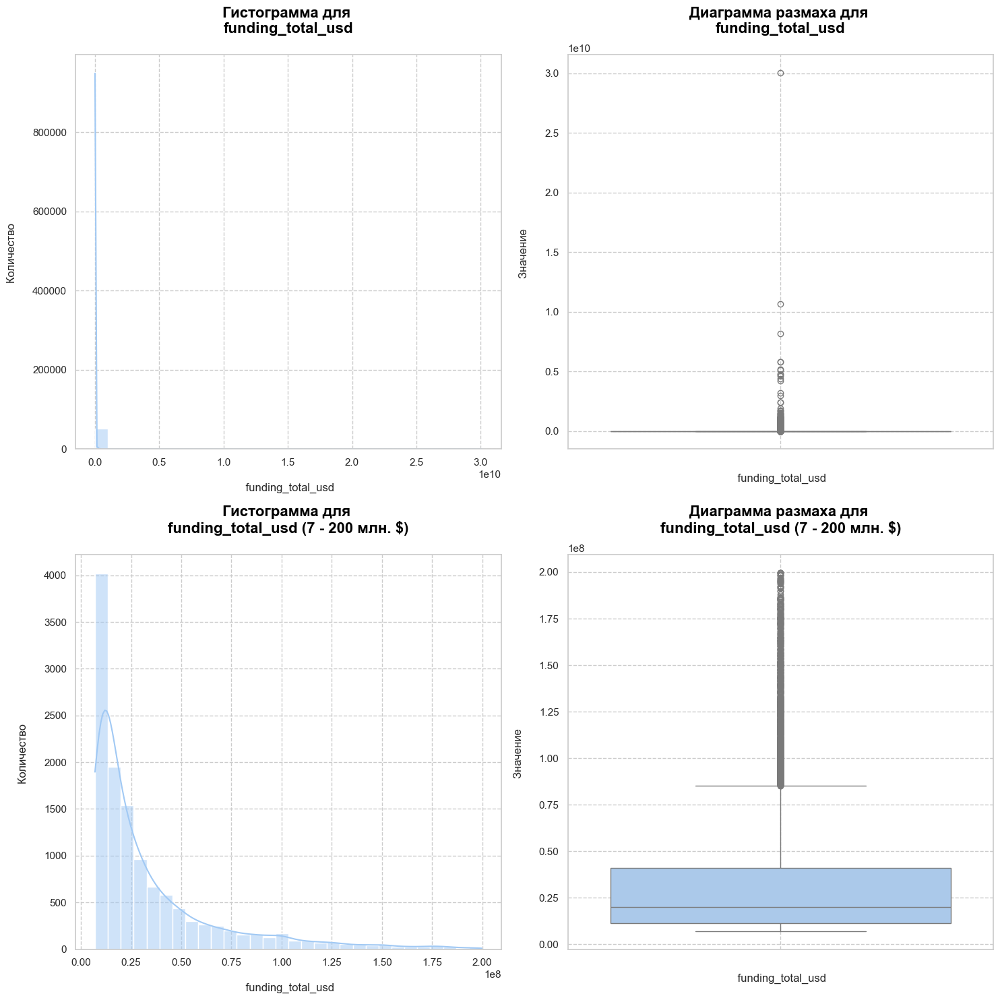

In [34]:
# делаю сетку для 3 графиков методом subplots
fig, axs = plt.subplots(2, 2, sharex=False, sharey=False, figsize=(15, 15))

# гистограмма с графиком плотности
sns.histplot(df_train['funding_total_usd'], bins=30, kde=True, ax=axs[0, 0])
axs[0, 0].ticklabel_format(axis='x')
axs[0, 0].set_xlabel('\n ' + 'funding_total_usd')
axs[0, 0].set_ylabel('Количество \n')
axs[0, 0].set_title('Гистограмма для \n' + 'funding_total_usd' + '\n', 
                    color='black', fontweight ='bold')
axs[0, 0].grid(linestyle='--')

# диаграмма размаха
sns.boxplot(y=df_train['funding_total_usd'], ax=axs[0, 1])
axs[0, 1].ticklabel_format(axis='y')
axs[0, 1].set_xlabel('\n ' + 'funding_total_usd')
axs[0, 1].set_ylabel('Значение \n')
axs[0, 1].set_title('Диаграмма размаха для \n' + 'funding_total_usd' + '\n', 
                    color='black', fontweight ='bold')
axs[0, 1].grid(linestyle='--')

# гистограмма с графиком плотности
sns.histplot(df_train.query('7000000 < funding_total_usd < 200000000')['funding_total_usd'], bins=30, kde=True, ax=axs[1, 0])
axs[1, 0].ticklabel_format(axis='x')
axs[1, 0].set_xlabel('\n ' + 'funding_total_usd')
axs[1, 0].set_ylabel('Количество \n')
axs[1, 0].set_title('Гистограмма для \n' + 'funding_total_usd' + ' (7 - 200 млн. $)' + '\n', 
                    color='black', fontweight ='bold')
axs[1, 0].grid(linestyle='--')

# диаграмма размаха
sns.boxplot(y=df_train.query('7000000 < funding_total_usd < 200000000')['funding_total_usd'], ax=axs[1, 1])
axs[1, 1].ticklabel_format(axis='y')
axs[1, 1].set_xlabel('\n ' + 'funding_total_usd')
axs[1, 1].set_ylabel('Значение \n')
axs[1, 1].set_title('Диаграмма размаха для \n' + 'funding_total_usd' + ' (7 - 200 млн. $)' + '\n', 
                    color='black', fontweight ='bold')
axs[1, 1].grid(linestyle='--')

plt.tight_layout()

Из графиков можно определить границу в 100 млн. долларов как границу начала выбросов. Исключим из датафреймы объекты с общим объёмом инвестиций более 100 млн. долларов.

In [35]:
# исключаю выбросы в funding_total_usd с примененем функции .query()
df_train = df_train.query('funding_total_usd < 100000000')

Выведем какой процент данных остался после избавления от выбросов.

In [36]:
# вывожу остаток данных после EDA
print(
    f'{round(df_train.shape[0] / df_train_shape[0] * 100, 2)}%'
    f' - доля данных после исследовательского анализа в датасете "df_train"'
)

97.49% - доля данных после исследовательского анализа в датасете "df_train"


Первичный EDA завершён.

Проведём корреляционный анализ.<br>
Изучим взаимосвязи между признаками тренировочной выборки с применением хи-квадрат статистики.<br>
На предыдущем шаге мы обнаружили признаки с множеством уникальных значений: имена стартапов, описание местоположения (штаты, регионы, города) и даты (открытия, закрытия и инвестирования). Исключим их из корреляционного анализа, т.к. они заведомо покажут крайне высокую корреляцию. 

<>:41: SyntaxWarning: invalid escape sequence '\p'
<>:41: SyntaxWarning: invalid escape sequence '\p'
C:\Users\Borodulinav\AppData\Local\Temp\ipykernel_33996\878323659.py:41: SyntaxWarning: invalid escape sequence '\p'
  ax.set_title('Корреляция $\phi_K$ \n')


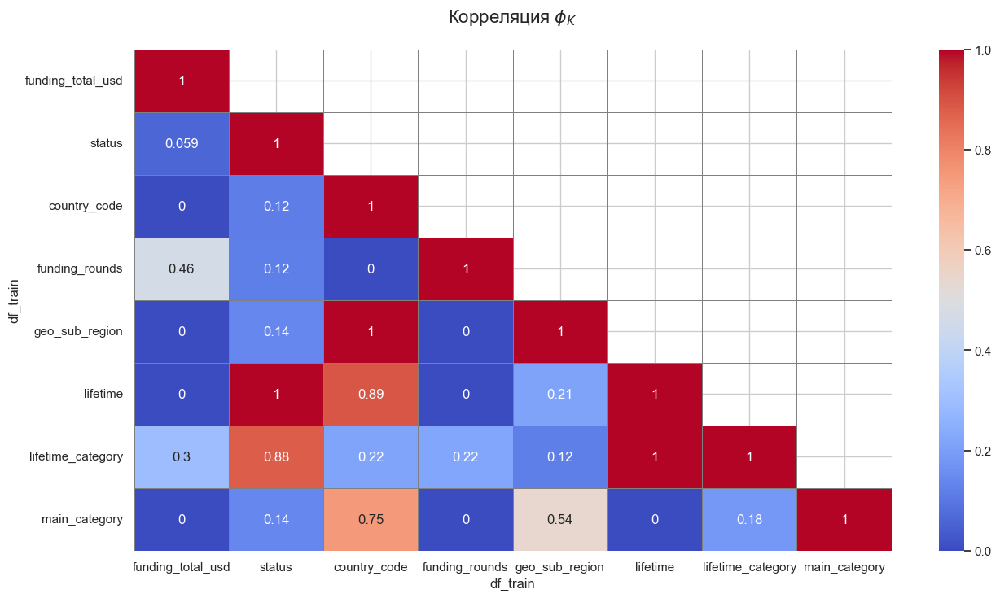

In [37]:
# создаю переменную со списком непрерывных признаков
interval_cols = ['funding_total_usd']

# создаю переменную с результатами корреляционного анализа
check_corr = (df_train
              .drop([
                  'name', 
                  'category_list', 
                  'state_code', 
                  'region', 
                  'city', 
                  'founded_at', 
                  'first_funding_at', 
                  'last_funding_at', 
                  'closed_at'
              ], axis=1)
              .sample(1000)
              .phik_matrix(interval_cols=interval_cols)
             )

# создаю тепловую карту корреляционного анализа
fig, ax = plt.subplots(figsize=(15, 8))

# создаю маски для отображения нижнего "треугольника зависимостей" и основной диагонали
mask = np.triu(np.ones_like(check_corr))
mask[np.diag_indices_from(mask)] = False

sns.heatmap(
    check_corr,
    annot=True,
    fmt='.2g',
    vmin=0,
    vmax=1,
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='grey',
    square=False,
    mask=mask,
    ax=ax
    )
ax.set_title('Корреляция $\phi_K$ \n')

plt.show()

Обнаруженные особенности:
- признаки `founded_at_year` и `last_fund_year` имеют весьма высокую зависимость (шкала Чеддока), т.к. 63,8% имеют 1 раунд инвестирования в дату основания. Даты первого и последнего инвестирования совпадают
- признаки `lifetime` и `lifetime_category` имеют прямую зависимость, т.к. последний был создан из колонки `lifetime`
- признаки `country_code` и `geo_sub_region` имеют прямую зависимость, т.к. последний был создан из колонки `country_code`
- высокую связь `country_code` и `main_category`, также как и `country_code` и `lifetime` можно объяснить большой долей уникальных значений в признаках категорий и кодов стран
- целевой признак `status` имеет весьма высокую зависимость с колонками `lifetime`, `lifetime_category`
- целевой признак `status` имеет крайне низкую связь с признаками `main_category`, `funding_rounds`, `funding_total_usd`, `founded_at_month`
- имеется мультиколлинеарность `status` с `lifetime`

Дополнительно рассмотрим корреляцию признаков для данных, разделённых по целевому признаку.

<>:43: SyntaxWarning: invalid escape sequence '\p'
<>:43: SyntaxWarning: invalid escape sequence '\p'
C:\Users\Borodulinav\AppData\Local\Temp\ipykernel_33996\3474280630.py:43: SyntaxWarning: invalid escape sequence '\p'
  ax.set_title('Корреляция $\phi_K$ (status "operating")\n')


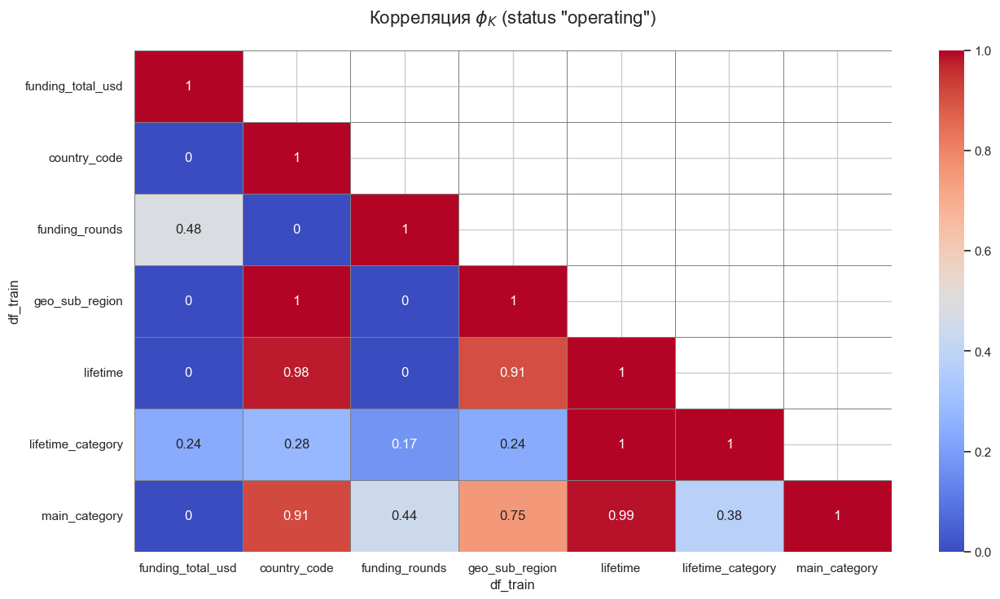

In [38]:
# создаю переменную со списком непрерывных признаков
interval_cols = ['funding_total_usd']

# создаю переменную с результатами корреляционного анализа
check_corr = (df_train
              .query('status == "operating"')
              .drop([
                  'name', 
                  'status',
                  'category_list', 
                  'state_code', 
                  'region', 
                  'city', 
                  'founded_at', 
                  'first_funding_at', 
                  'last_funding_at', 
                  'closed_at'
              ], axis=1)
              .sample(1000)
              .phik_matrix(interval_cols=interval_cols)
             )

# создаю тепловую карту корреляционного анализа
fig, ax = plt.subplots(figsize=(15, 8))

# создаю маски для отображения нижнего "треугольника зависимостей" и основной диагонали
mask = np.triu(np.ones_like(check_corr))
mask[np.diag_indices_from(mask)] = False

sns.heatmap(
    check_corr,
    annot=True,
    fmt='.2g',
    vmin=0,
    vmax=1,
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='grey',
    square=False,
    mask=mask,
    ax=ax
    )
ax.set_title('Корреляция $\phi_K$ (status "operating")\n')

plt.show()

<>:43: SyntaxWarning: invalid escape sequence '\p'
<>:43: SyntaxWarning: invalid escape sequence '\p'
C:\Users\Borodulinav\AppData\Local\Temp\ipykernel_33996\4083455016.py:43: SyntaxWarning: invalid escape sequence '\p'
  ax.set_title('Корреляция $\phi_K$ (status "closed")')


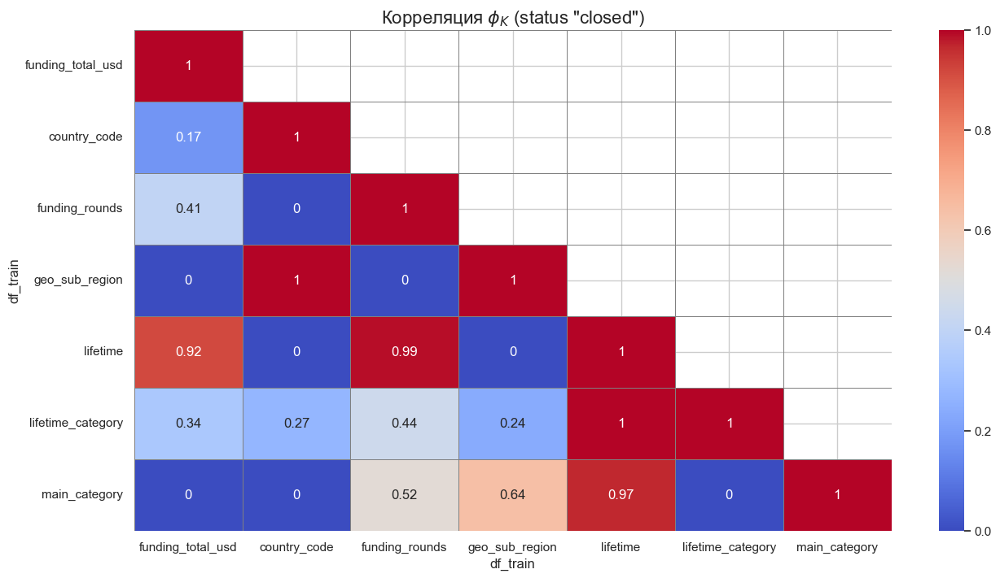

In [39]:
# создаю переменную со списком непрерывных признаков
interval_cols = ['funding_total_usd']

# создаю переменную с результатами корреляционного анализа
check_corr = (df_train
              .query('status == "closed"')
              .drop([
                  'name', 
                  'status',
                  'category_list', 
                  'state_code', 
                  'region', 
                  'city', 
                  'founded_at', 
                  'first_funding_at', 
                  'last_funding_at', 
                  'closed_at'
              ], axis=1)
              .sample(1000)
              .phik_matrix(interval_cols=interval_cols)
             )

# создаю тепловую карту корреляционного анализа
fig, ax = plt.subplots(figsize=(15, 8))

# создаю маски для отображения нижнего "треугольника зависимостей" и основной диагонали
mask = np.triu(np.ones_like(check_corr))
mask[np.diag_indices_from(mask)] = False

sns.heatmap(
    check_corr,
    annot=True,
    fmt='.2g',
    vmin=0,
    vmax=1,
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='grey',
    square=False,
    mask=mask,
    ax=ax
    )
ax.set_title('Корреляция $\phi_K$ (status "closed")')

plt.show()

После разделения данных по целевому признаку, заметна особенность, что повляется весьма высокая корреляция `lifetime` с признаками `funding_rounds`, `funding_total_usd`.

Проанализируем зависимость целевого признака `status` от других числовых признаков при помощи матрицы рассеяния. Для это используем метод PairGrid библиотеки Seaborn, который выведет на экран матрицу зависимостей, одновременно подсвечивая разными цветами зависимость от категориального признака.

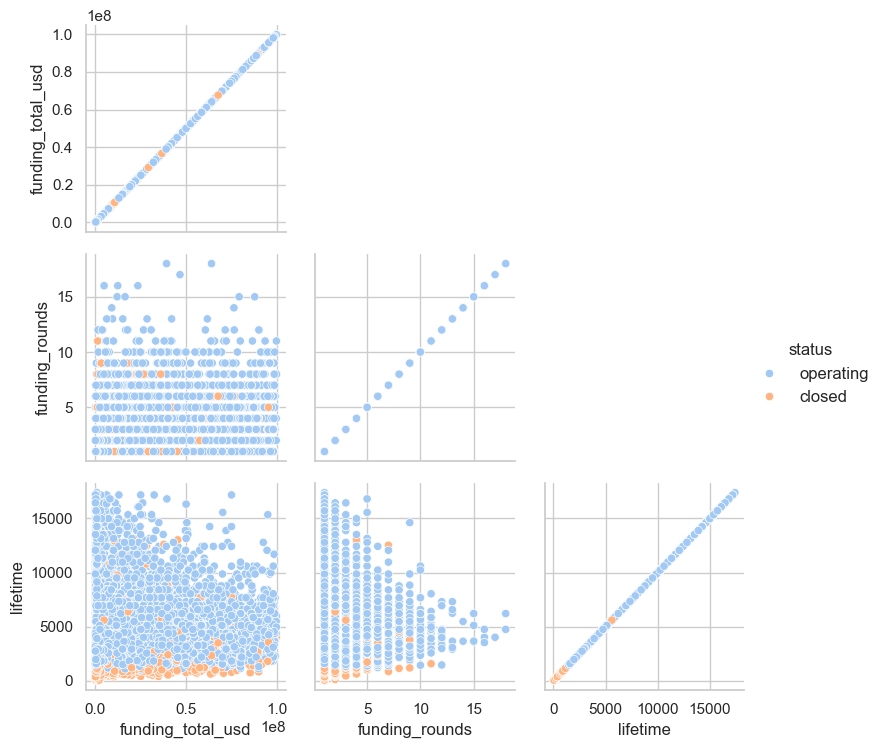

In [41]:
# строю матрицу рассеяния
dep = sns.PairGrid(
    df_train[[
        'funding_total_usd',
        'status',
        'funding_rounds',
        'lifetime',
        #'founded_at_year',
        #'founded_at_month',
        #'last_fund_year'        
    ]],
    hue='status',
    diag_sharey=False,
    corner=True
)

dep.map(sns.scatterplot)
dep.add_legend()

plt.show()

Обнаруженные особенности:
- нет высоких общих сумм инвестирования и раундов инвестирования для стартапов с длительным существованием
- стартапы до 2000 гг. получали куда меньшие средства и реже, чем созданные позднее
- закрывшиеся стартапы имеют широкий спектр вложенных в них сумм, как и раундов инвестирования

Будет важным и интересным проверить есть ли принципиальное различие в признаках для групп стартапов, которые продолжили существовать и закрылись. Проведём дополнительный анализ. Разделим датафрейм на 2 страты и сопоставим признаки между собой для поиска отличительных особенностей.

                                             |          | [  0%]   00:00 -> (? left)


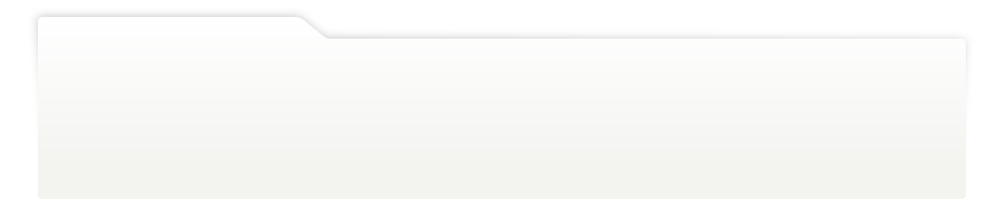
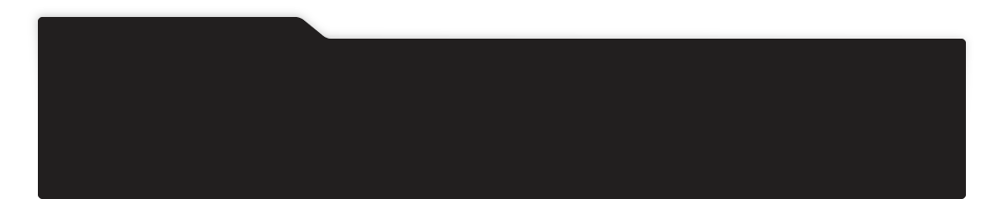
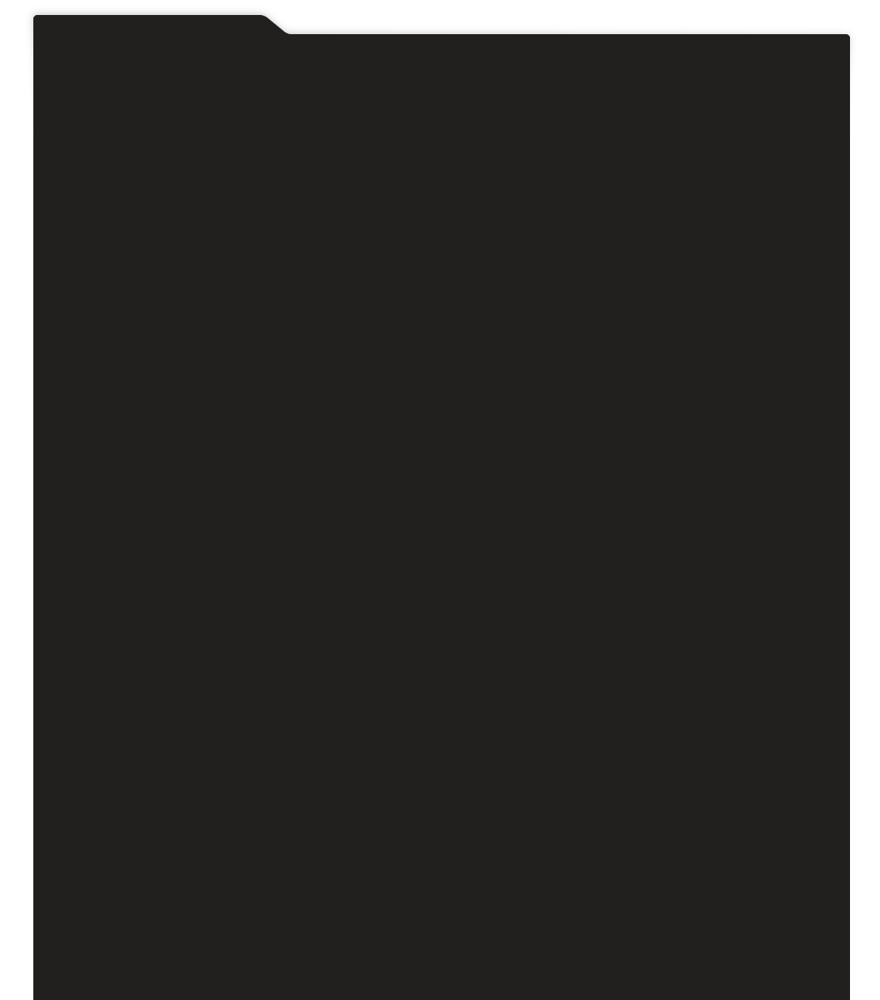
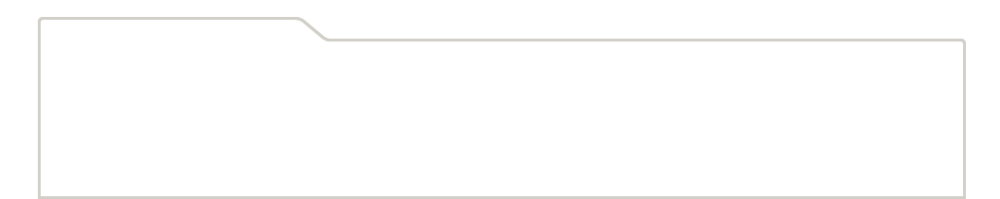
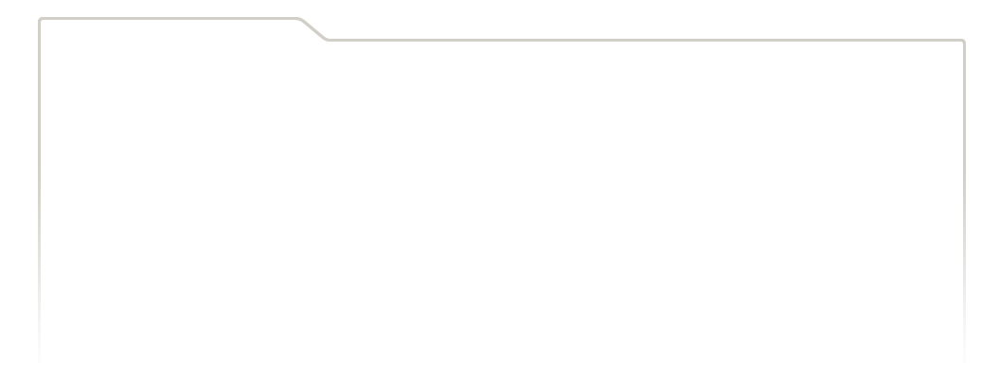
...
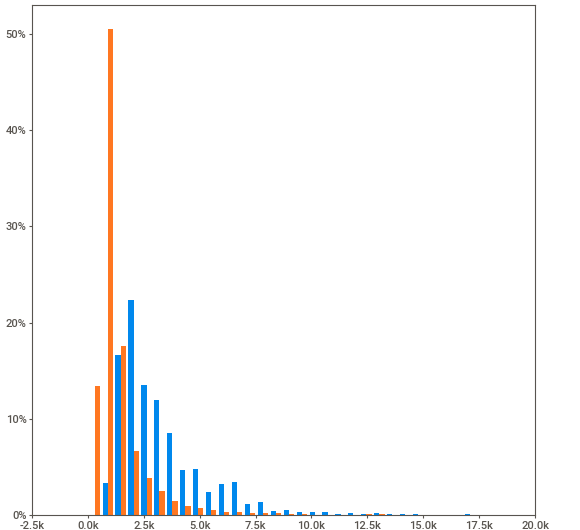
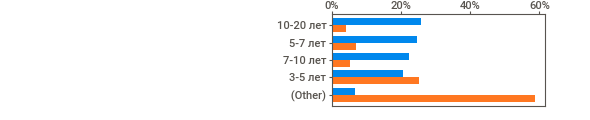
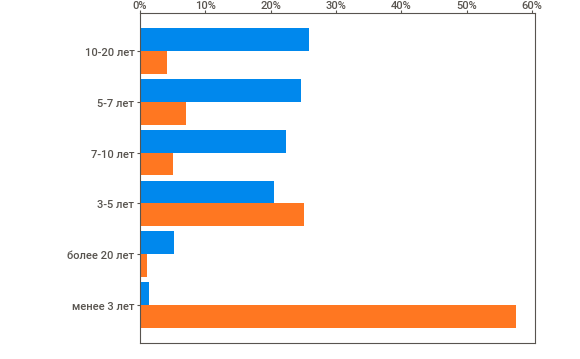
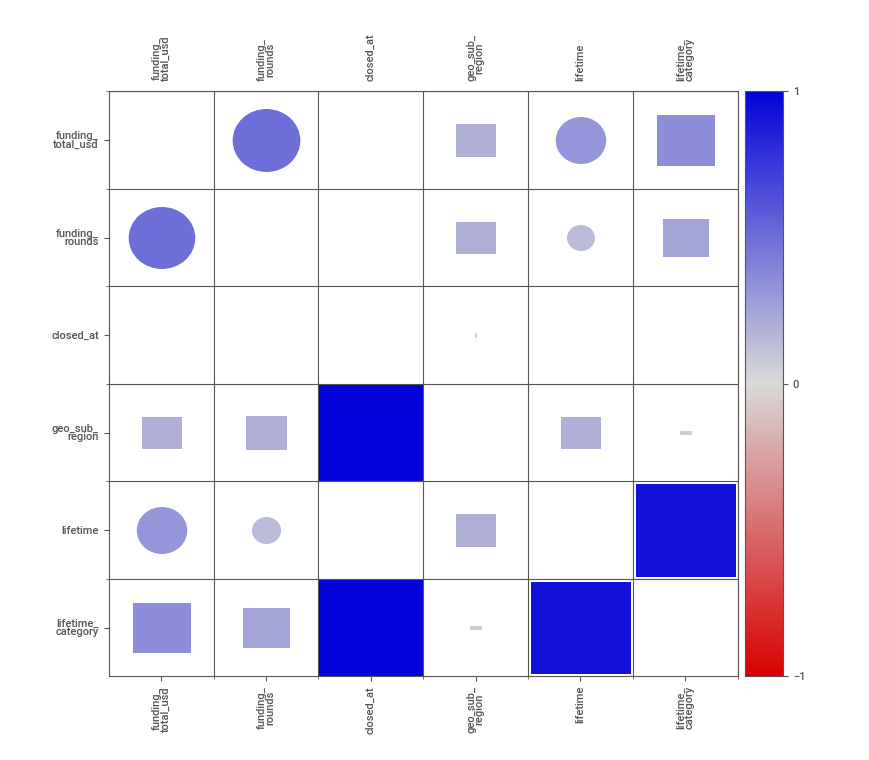
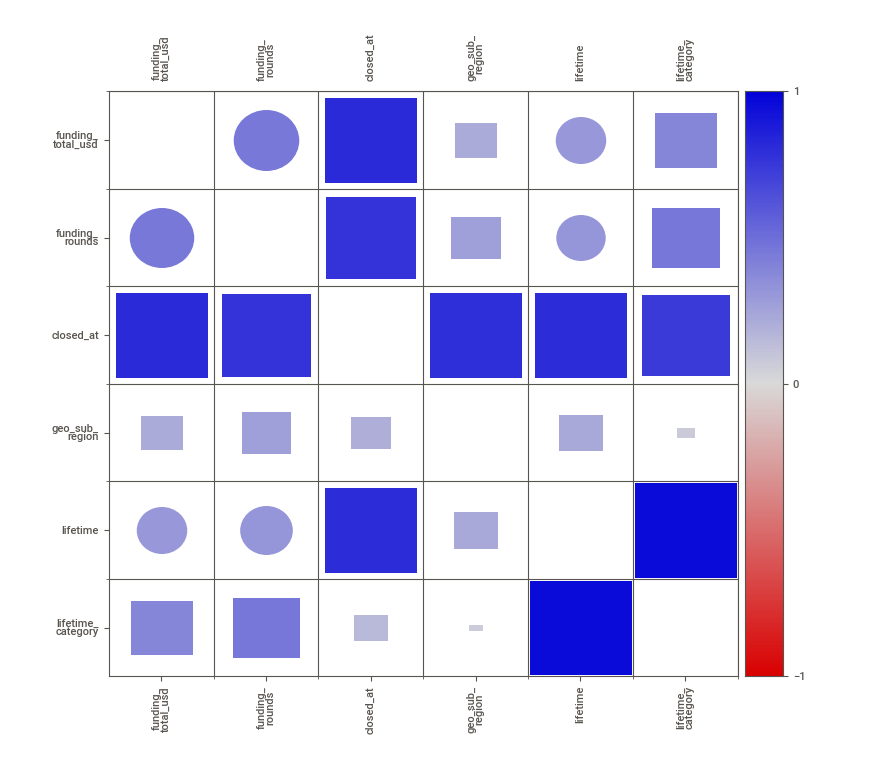

In [42]:
# использую библиотеку sweetviz, применяю функцию compare()
comp_status = sv.compare(
    [
        df_train.query('status == "operating"').drop([
          'name', 
          'status',
          'category_list', 
          'state_code', 
          'region', 
          'city'
        ], axis=1), 
        'Работает'
    ], 
    [
        df_train.query('status == "closed"').drop([
          'name', 
          'status',
          'category_list', 
          'state_code', 
          'region', 
          'city'
        ], axis=1), 
        'Закрылся'
    ]
)

# применяю метод show_notebook() для вывода сравнения на экран
comp_status.show_notebook(scale=0.95)

Сравнительный анализ 2 групп выявил следующие отличительные особенности:
- закрытые стартапы чаще не имеют данных о своём местоположении или категории
- логично, что закрытые стартапы имеют гораздо чаще маленькое значение lifetime

Проведём аналогичный корреляционный анализ, но для тестовой выборки.<br>
Изучим взаимосвязи между признаками тестовой выборки с применением хи-квадрат статистики.

<>:39: SyntaxWarning: invalid escape sequence '\p'
<>:39: SyntaxWarning: invalid escape sequence '\p'
C:\Users\Borodulinav\AppData\Local\Temp\ipykernel_33996\1454863906.py:39: SyntaxWarning: invalid escape sequence '\p'
  ax.set_title('Корреляция $\phi_K$')


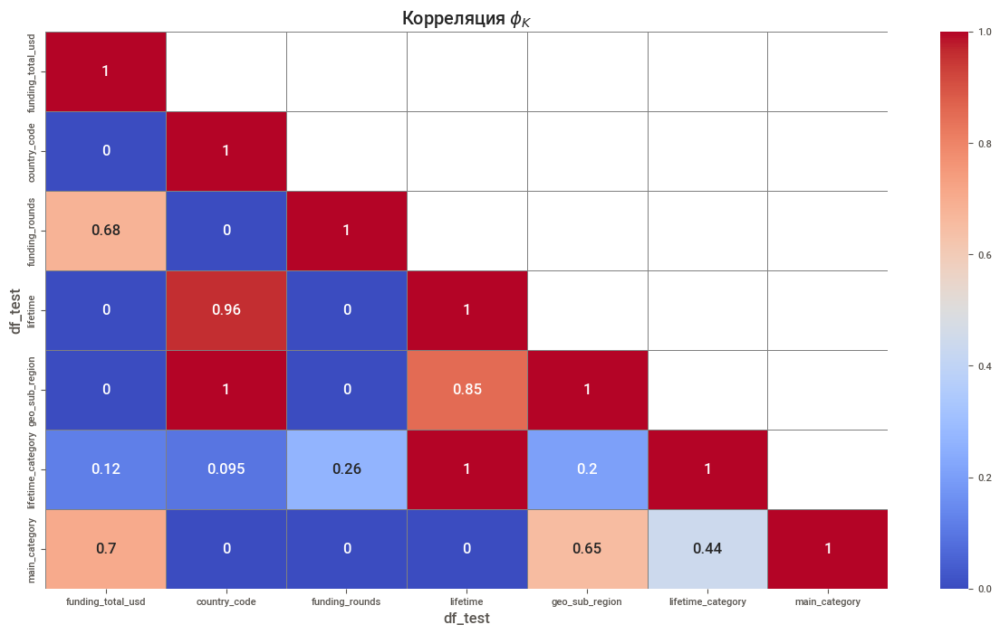

In [43]:
# создаю переменную со списком непрерывных признаков
interval_cols = ['funding_total_usd']

# создаю переменную с результатами корреляционного анализа
check_corr = (df_test
              .drop([
                  'name', 
                  'category_list', 
                  'state_code', 
                  'region', 
                  'city', 
                  'first_funding_at', 
                  'last_funding_at', 
              ], axis=1)
              .sample(1000)
              .phik_matrix(interval_cols=interval_cols)
             )

# создаю тепловую карту корреляционного анализа
fig, ax = plt.subplots(figsize=(15, 8))

# создаю маски для отображения нижнего "треугольника зависимостей" и основной диагонали
mask = np.triu(np.ones_like(check_corr))
mask[np.diag_indices_from(mask)] = False

sns.heatmap(
    check_corr,
    annot=True,
    fmt='.2g',
    vmin=0,
    vmax=1,
    cmap='coolwarm',
    linewidths=0.5,
    linecolor='grey',
    square=False,
    mask=mask,
    ax=ax
    )
ax.set_title('Корреляция $\phi_K$')

plt.show()

Анализ показал аналогичные по силе взаимосвязи, что и для тренировочной выборки.<br>
Построим матрицу рассеяния для числовых признаков.

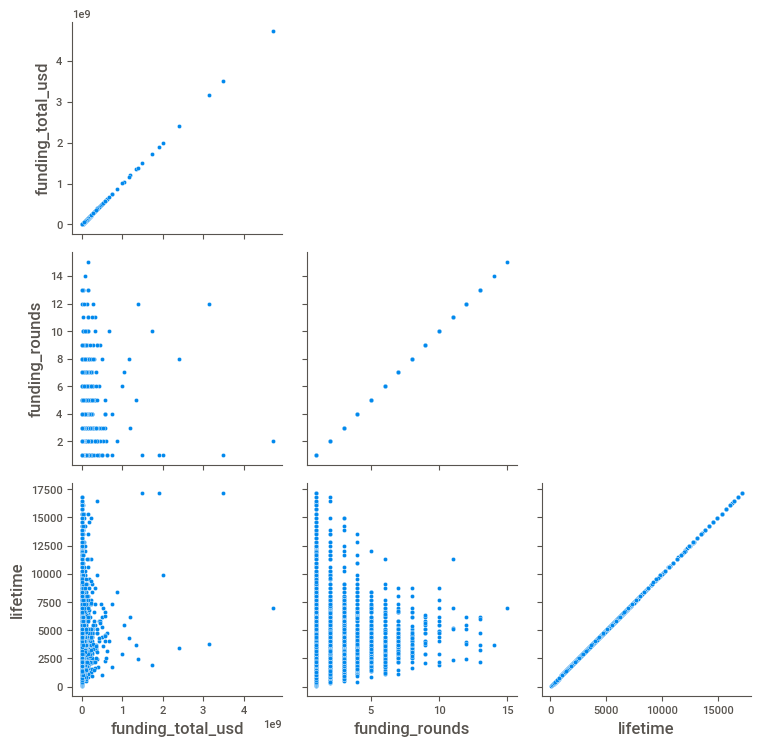

In [44]:
# строю матрицу рассеяния
dep = sns.PairGrid(
    df_test[[
        'funding_total_usd',
        'funding_rounds',
        'lifetime',
        #'last_fund_year' 
    ]],
    diag_sharey=False,
    corner=True
)

dep.map(sns.scatterplot)
dep.add_legend()

plt.show()

Получаем особенности аналогичные, что и для тренировочной выборки.

Проведём дополнительный анализ в поисках зависимости жизнеспособности стартапа от времени его существования.

Используем T-тест для средних двух независимых выборок, который проверит, что две независимые выборки имеют идентичные средние (ожидаемые) значения. Гипотеза формируется для признака `lifetime` из двух выборок: действующие и закрытые стартапы.

Проверим условия выполнения теста:
- Генеральные совокупности не зависят друг от друга
- Выборочные средние нормально распределены (благодаря ЦПТ)
- Дисперсии рассматриваемых генеральных совокупностей равны (т.к. выборки > 30 строк)

Сформулируем гипотезы:
- H<sub>0</sub>: между средними значениями длительности существования стартапов двух статусов нет разницы, они равны<br>
- H<sub>1</sub>: среднее значение длительности существования закрытого стартапа меньше среднего значения параметра для действующего стартапа

In [45]:
# задаю уровень статистической значимости, если p-value окажется меньше него, отвергну гипотезу
alpha = 0.01

# использую подход сравнения двух независимых совокупностей
# вношу результаты метода st.ttest_ind() в переменную results
results = st.ttest_ind(
    df_train.query('status == "closed"')['lifetime'], 
    df_train.query('status == "operating"')['lifetime'], 
    equal_var=True, 
    alternative='less'
)

# вывожу на экран значение P-value
print('p-значение:', results.pvalue)

# делаю вывод о нулевой гипотезе
if results.pvalue < alpha:
    print(color.RED + 'Отвергаем нулевую гипотезу' + color.END)
else:
    print(color.GREEN + 'Не получилось отвергнуть нулевую гипотезу' + color.END)

p-значение: 0.0
Отвергаем нулевую гипотезу


T-тест показал, что гипотеза о равных средних значениях длительности существования стартапов для двух групп отвергнута.<br>
Построим сравнительную гистограмму.

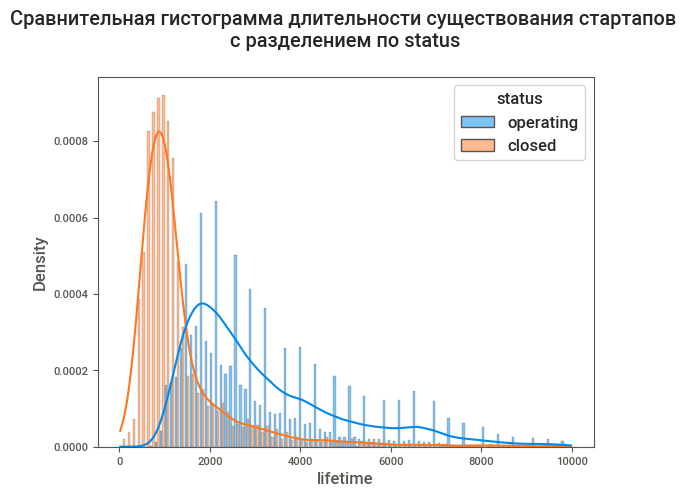

In [46]:
# строю сравнительную гистограмму 
sns.histplot(
    data=df_train.query('lifetime < 10000')[['lifetime', 'status']],
    x='lifetime',
    hue='status',
    stat='density', 
    common_norm=False,
    multiple="dodge",
    shrink=0.9,
    kde=True
).set_title('Сравнительная гистограмма длительности существования стартапов \n с разделением по status \n')

plt.show()

Гистограмма показывает явную взаимосвязь между признаками: мода `lifetme` для закрытых стартапов находится около значения 1000 дней, тогда как для действующих - 2000.

**Промежуточные выводы по шагу "Исследовательский анализ данных"**

Выполнены следующие шаги:
1. проведён исследовательский анализ признаков с помощью библиотеки YData-profiling
2. исключены выбросы из df_train - объекты с общим объёмом инвестиций более 100 млн. долларов
3. проведён корреляционный анализ для тренировочного и тестового датафреймов
4. дополнительно выведены на экран корреляционные матрицы для данных с разбивкой по статусу
5. построены диаграммы рассеяния для числовых признаков с подсветкой данных по статусу
6. выполнен сравнительный анализ двух датафреймов, разбитых по признаку `status`
7. выдвинута и проверена гипотеза, что между средними значениями длительности существования стартапов двух типов (действующие и закрытые) нет разницы, они равны. Гипотеза отвергнута в пользу альтернативной. Для наглядности построена сравнительная гистограмма с плотностью распределения. 




Обнаруженные особенности:
- столбец `status` имеет дисбаланс данных (91% - operating и 9% - closed)
- `geo_sub_region` имеет дисбаланс данных
- `funding_total_usd` имеется сильное смещение, что говорит о наличии выбросов: 95% перцентиль около 56 млн. долларов при максимуме в 30 млрд.
- `category list` состоит из уникальных значений на 42%
- почти 57% значений `country_code` - это USA
- 301 уникальное значение и 20% - California для столбца `state_code`
- признак `funding rounds` имеет от 1 до 19 раундов с медианным значением 1 (63,8% объектов). Гистограмма сильно смещена влево
- большинство стартапов из датасета были созданы между 2018 и 2016 годами
- порядка 70% стартапов созданы в странах Североамериканского и Западноевропейского региона
- минимальное `lifetime` - 17 дней. 50% стартапов живут в пределах 1740 - 4018 дней. Медианное значение 2557 дня (или 7 лет)
- Порядка 3% стартапов были созданы и единовременно профинансированы в одну и ту же дату
- 5-6 % компаний были впервые профинансированы даже ранее их даты создания. Это может быть ошибкой. Проинформируем об этом инженеров данных и представителей бизнеса
- Более 50% стартапов получали инвестиции в последний раз в 2013 году.
- 707 уникальных значений `main_catagory`. Удалось сократить количество уникальных категорий с 22 тыс. до 700.
- колонки датафрейма df_test имеют аналогичные особенности, что и у df_train
- признаки `founded_at_year` и `last_fund_year` имеют весьма высокую зависимость (шкала Чеддока), т.к. 63,8% имеют 1 раунд инвестирования в дату основания. Даты первого и последнего инвестирования совпадают
- признаки `lifetime` и `lifetime_category` имеют прямую зависимость, т.к. последний был создан из колонки `lifetime`
- признаки `country_code` и `geo_sub_region` имеют прямую зависимость, т.к. последний был создан из колонки `country_code`
- высокую связь `country_code` и `main_category`, также как и `country_code` и `lifetime` можно объяснить большой долей уникальных значений в признаках категорий и кодов стран
- целевой признак `status` имеет весьма высокую зависимость с колонками `lifetime`, `lifetime_category`
- целевой признак `status` имеет крайне низкую связь с признаками `main_category`, `funding_rounds` и `funding_total_usd`
- имеется мультиколлинеарность `status` с `lifetime`
- нет высоких общих сумм инвестирования и раундов инвестирования для стартапов с длительным существованием
- стартапы до 2000 гг. получали куда меньшие средства и реже, чем созданные позднее
- закрывшиеся стартапы имеют широкий спектр вложенных в них сумм, как и раундов инвестирования
- закрытые стартапы чаще не имеют данных о своём местоположении или категории
- логично, что закрытые стартапы имеют гораздо чаще маленькое значение lifetime

## Подготовка данных

Для поиска лучшей модели подготовим данные. Создадим пайплайн с использованием ColumnTransformer. Количественные и категориальные данные обработаем в пайплайне раздельно.

Прогнозирование статуса стартапа - это задача классификации. Поиск более подходящей модели будет выполняться среди трёх моделей, для каждой из которых есть свои требования к подготовке данных. Логистическая регрессия и kNN чувствительны к масштабированию. Тогда как для дерева решения масштрабирование опционально и модель может работать с ранговыми признаками, но применение кодировщика OrdinalEncoder в нашем исследовании не потребуется.

In [56]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51196 entries, 0 to 52515
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               51196 non-null  object        
 1   category_list      51196 non-null  object        
 2   funding_total_usd  51196 non-null  float32       
 3   status             51196 non-null  object        
 4   country_code       51196 non-null  object        
 5   state_code         51196 non-null  object        
 6   region             51196 non-null  object        
 7   city               51196 non-null  object        
 8   funding_rounds     51196 non-null  int32         
 9   founded_at         51196 non-null  datetime64[ns]
 10  first_funding_at   51196 non-null  datetime64[ns]
 11  last_funding_at    51196 non-null  datetime64[ns]
 12  closed_at          51196 non-null  datetime64[ns]
 13  geo_sub_region     51196 non-null  object        
 14  lifetime   

In [64]:
# разделяю датасет df_train на входные и целевой признаки
X = df_train.drop([
    'name',      
    'category_list',
    #'funding_total_usd',
    'status',
    'country_code',     
    'state_code',
    'region',
    'city',
    #'funding_rounds',
    'founded_at',
    'first_funding_at',
    'last_funding_at',
    'closed_at',
    #'geo_sub_region',
    #'lifetime',
    #'lifetime_category',
    'main_category'
   
], axis=1).copy()
y = df_train['status'].copy()

# разделяю данные на тренировочную и валидационную выборки
X_train, X_valid, y_train, y_valid = train_test_split(
    X,
    y,
    test_size = TEST_SIZE, 
    random_state = RANDOM_STATE
)

# вывожу на экран размер получившихся данных после подготовки
print(color.BLUE + color.BOLD + 'Размер подготовленных выборок:'+ color.END)
display(pd.DataFrame(
    data={
        'Входные признаки(X)': [X_train.shape, X_valid.shape],
        'Целевой признак(y)': [y_train.shape, y_valid.shape]
    }, 
    index=['Тренировочные данные', 'Тестовые данные']
))
print()

# создаю списки признаков
cat_columns = X.select_dtypes(exclude='number').columns.tolist()
num_columns = X.select_dtypes(include='number').columns.tolist()

# создаю экземпляр класса LabelEncoder для кодирования целевого признака
# обучаю модель и трансформирую тренировочную выборку, трансформирую тестовую выборку
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_valid = label_encoder.transform(y_valid)

# вывожу на экран коды категорий целевого признака
print(color.BLUE + color.BOLD + 'Результат кодирования целевого признака:'+ color.END)
display(pd.DataFrame(data=label_encoder.classes_, columns=['quit']))

# создаю пайплайны для подготовки признаков
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [
        ('sImputer_nan_mf', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
        ('sImputer_sp_mf', SimpleImputer(missing_values = ' ', strategy='most_frequent')),
        ('ohe', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
    ]
)

# SimpleImputer + Scaler
num_pipe = Pipeline(
    [
        ('sImputer_nan_med', SimpleImputer(missing_values=np.nan, strategy='median')),
        ('scaler', StandardScaler())
    ]
)

# создаю общий пайплайн подтоговки данных
# для моделей использующих градиентный спуск и евклидово расстояние
data_preprocessor = ColumnTransformer(
    [
        ('cat', ohe_pipe, cat_columns),
        ('num', num_pipe, num_columns)
    ], 
    remainder='passthrough'
)

# итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', None)
    ]
)

# использую pipeline для подготовки данных
X_train_pr = data_preprocessor.fit_transform(X_train)
X_valid_pr = data_preprocessor.transform(X_valid)

Размер подготовленных выборок:


,Входные признаки(X),Целевой признак(y)
Тренировочные данные,"(38397, 5)","(38397,)"
Тестовые данные,"(12799, 5)","(12799,)"



Результат кодирования целевого признака:


,quit
0,closed
1,operating


C:\Users\Borodulinav\.ai-navigator\micromamba\envs\cpu\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [60]:
# создаю список признаков после процесса кодирования
names_ohe = data_preprocessor.transformers_[0][1]['ohe'].get_feature_names_out(cat_columns)
columns_full = names_ohe.tolist() + num_columns

# формирую датафреймы подготовленных данных с входными признаками
X_train_pr = pd.DataFrame(X_train_pr, columns=columns_full)
X_valid_pr = pd.DataFrame(X_valid_pr, columns=columns_full)

# вывожу произвольные 5 значений из тренировочной и тестовой выборок для валидации
display(X_train_pr.sample(5))
display(X_valid_pr.sample(5))

,geo_sub_region_Central America,geo_sub_region_Central Europe,geo_sub_region_East Asia,geo_sub_region_Eastern Africa,geo_sub_region_Eastern Europe,geo_sub_region_Indian Ocean,geo_sub_region_North America,geo_sub_region_Northern Africa,geo_sub_region_Northern Asia,geo_sub_region_Northern Europe,geo_sub_region_Pacific,geo_sub_region_South America,geo_sub_region_South Asia,geo_sub_region_South East Asia,geo_sub_region_South East Europe,geo_sub_region_South West Asia,geo_sub_region_South West Europe,geo_sub_region_Southern Africa,geo_sub_region_Southern Europe,geo_sub_region_West Indies,geo_sub_region_Western Africa,geo_sub_region_Western Europe,geo_sub_region_no_region,lifetime_category_3-5 лет,lifetime_category_5-7 лет,lifetime_category_7-10 лет,lifetime_category_более 20 лет,lifetime_category_менее 3 лет,funding_total_usd,funding_rounds,lifetime
37035,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.30,1.06,-0.39
14044,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.39,-0.55,1.13
37258,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,-0.08,0.25,-0.26
13655,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,-0.06,-0.55,0.62
31157,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.46,-0.55,1.13


,geo_sub_region_Central America,geo_sub_region_Central Europe,geo_sub_region_East Asia,geo_sub_region_Eastern Africa,geo_sub_region_Eastern Europe,geo_sub_region_Indian Ocean,geo_sub_region_North America,geo_sub_region_Northern Africa,geo_sub_region_Northern Asia,geo_sub_region_Northern Europe,geo_sub_region_Pacific,geo_sub_region_South America,geo_sub_region_South Asia,geo_sub_region_South East Asia,geo_sub_region_South East Europe,geo_sub_region_South West Asia,geo_sub_region_South West Europe,geo_sub_region_Southern Africa,geo_sub_region_Southern Europe,geo_sub_region_West Indies,geo_sub_region_Western Africa,geo_sub_region_Western Europe,geo_sub_region_no_region,lifetime_category_3-5 лет,lifetime_category_5-7 лет,lifetime_category_7-10 лет,lifetime_category_более 20 лет,lifetime_category_менее 3 лет,funding_total_usd,funding_rounds,lifetime
3234,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,-0.43,-0.55,-0.43
11670,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,-0.43,-0.55,-1.02
10954,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,-0.35,-0.55,-0.09
6168,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,-0.42,-0.55,-0.43
6191,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,-0.48,0.25,-0.42


## Обучение модели

Обучим и выведем метрику F1-score на моделях: Логистическая регрессия, kNN, Дерево решений.<br>
Подбор гиперпараметров выполним с помощью OptunaSearchCV.

In [69]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV



# Словарь для сохранения результатов
results = {}

# Цикл перебора моделей
for model_name in ['GradientBoostingClassifier', 'KNeighborsClassifier', 'DecisionTreeClassifier']:
    if model_name == 'GradientBoostingClassifier':
        model = GradientBoostingClassifier(random_state=42)
        parameters = {
            'n_estimators': [50, 75, 200],  # Список значений
            'learning_rate': [0.05, 0.15, 0.2],  # Список значений
            'max_depth': range(4, 8),  # Диапазон значений
            'min_samples_split': range(10, 20),  # Диапазон значений
            'min_samples_leaf': range(2, 10)  # Диапазон значений
        }

    elif model_name == 'KNeighborsClassifier':
        model = KNeighborsClassifier()
        parameters = {
            'n_neighbors': range(2, 41),  # Диапазон количества соседей
            'weights': ['uniform', 'distance'],  # Метод взвешивания
            'p': [1, 2]  # Метрика расстояния (Манхэттен, Евклид)
        }

    elif model_name == 'DecisionTreeClassifier':
        model = DecisionTreeClassifier(random_state=42)
        parameters = {
            'max_depth': range(3, 11),  # Диапазон глубины дерева
            'min_samples_split': range(5, 21),  # Минимальное количество разбиений
            'min_samples_leaf': range(1, 11)  # Минимальное количество листьев
        }

    # RandomizedSearchCV для каждой модели
    oscv = RandomizedSearchCV(
        estimator=model,
        param_distributions=parameters,
        n_iter=20,  # Число испытаний
        scoring='f1',
        cv=3,
        random_state=42,
        refit=True,
        n_jobs=-1
    )

    
    # Обучение модели
    oscv.fit(X_train_pr, y_train)

    # Сохранение результатов в словарь
    results[model_name] = {
        'best_params': oscv.best_params_,
        'best_score': oscv.best_score_
    }

# Задаю формат отображения непрерывных величин (5 знаков после запятой)
pd.options.display.float_format = '{:,.5f}'.format

# Вывод результатов обучения с полной информацией о гиперпараметрах
print("Результаты работы моделей:")
results_df = pd.DataFrame(
    data={
        'Лучшие гиперпараметры': [
            str(results['GradientBoostingClassifier']['best_params']),
            str(results['KNeighborsClassifier']['best_params']),
            str(results['DecisionTreeClassifier']['best_params'])
        ],
        'Лучшая метрика F1': [
            results['GradientBoostingClassifier']['best_score'],
            results['KNeighborsClassifier']['best_score'],
            results['DecisionTreeClassifier']['best_score']
        ]
    },
    index=[
        'Gradient Boosting',
        'kNN',
        'Decision Tree'
    ]
)
display(results_df)

# Возвращаю формат отображения непрерывных величин (2 знака после запятой)
pd.options.display.float_format = '{:,.2f}'.format

Результаты работы моделей:


,Лучшие гиперпараметры,Лучшая метрика F1
Gradient Boosting,"{'n_estimators': 75, 'min_samples_split': 15, 'min_samples_leaf': 9, 'max_depth': 5, 'learning_rate': 0.05}",0.97490
kNN,"{'weights': 'uniform', 'p': 1, 'n_neighbors': 21}",0.97307
Decision Tree,"{'min_samples_split': 12, 'min_samples_leaf': 7, 'max_depth': 7}",0.97316


Сведём результаты работы всех моделей в единую таблицу.

In [ ]:
# задаю формат отображения непрерывных величин (5 знаков после запятой)
pd.options.display.float_format ='{:,.5f}'.format

# вывожу на экран результаты обучения 
print(color.BLUE + color.BOLD + 'Результаты работы моделей:'+ color.END)
display(pd.DataFrame(
    data={
        'Лучшие гиперпараметры': [
            oscv_log_best_params, 
            oscv_knn_best_params, 
            oscv_dtr_best_params
        ],
        'Лучшая метрика F1': [
            oscv_log_best_score,
            oscv_knn_best_score,
            oscv_dtr_best_score
        ]
    }, 
    index=[
        'Logistic regression',
        'kNN',
        'DecisionTree'
    ]
))

# возвращаю формат отображения непрерывных величин (2 знака после запятой)
pd.options.display.float_format ='{:,.2f}'.format

Лучшая метрика F1 на кросс-валидации получилась у модели Логистической регресии и равна 99,81%.<br>
Выполним сравнительную оценку построенной модели с baseline моделью DummyClassifier.

In [71]:
# инициализирую DummyClassifier и обучаю модель
dummy_clf = DummyClassifier(random_state=RANDOM_STATE)
dummy_clf.fit(X_train, y_train)

dummy_pred = dummy_clf.predict(X_valid)
dummy_f1 = f1_score(y_valid, dummy_pred)

# вывожу на экран F1 на тестовых данных
print(f'Метрика F1 на тестовой выборке в DummyClassifier: {dummy_f1:.3f}')

Метрика F1 на тестовой выборке в DummyClassifier: 0.948


Получили метрику у базовой константной модели 0,951. Что ниже 0,998 у модели LogisticRegression.<br>
Это подтверждает эффективность выбранной модели для решения задачи классификации.

Попробуем улучшить показатели метрики и найти при каком количестве признаков модель выдаёт самый высокий результат.

In [72]:
# использую pipeline для подготовки данных
X_train_pr = data_preprocessor.fit_transform(X_train)
X_valid_pr = data_preprocessor.transform(X_valid)

# создаю список признаков после процесса кодирования
names_ohe = data_preprocessor.transformers_[0][1]['ohe'].get_feature_names_out(cat_columns)
columns_full = names_ohe.tolist() + num_columns

# формирую датафреймы подготовленных данных с входными признаками
X_train_pr = pd.DataFrame(X_train_pr, columns=columns_full)
X_valid_pr = pd.DataFrame(X_valid_pr, columns=columns_full)

# вывожу на экран размер получившихся данных после подготовки
print(color.BLUE + color.BOLD + 'Размер подготовленных данных:'+ color.END)
display(pd.DataFrame(
    data={
        'Входные признаки(X)': [X_train_pr.shape, X_valid_pr.shape],
        'Целевой признак(y)': [y_train.shape, y_valid.shape]
    }, 
    index=['Тренировочные данные', 'Тестовые данные']
))
print()

# инициализирую лучшую модель
model_log = LogisticRegression(
    max_iter=2000,
    class_weight='balanced',
    random_state=RANDOM_STATE
)

# создаю пустые списки для внесения в них данных
k_qty=[]
score_train_mean=[]
score_train_std=[]
score_valid=[]

# с помощью цикла веду поиск лучшего набора признаков для обучения модели
# сохраняю результаты F1 после кросс-валидации в созданные ранее списки
for i in range(len(X_train_pr.columns)):
    selector = SelectKBest(f_classif, k=i+1)
    selector.fit(X_train_pr, y_train)
    
    features_names = X_train_pr.columns[selector.get_support(indices=True)]
    
    X_train_sel = X_train_pr[list(features_names)]
    X_valid_sel = X_valid_pr[list(features_names)]
    
    result_train = cross_val_score(model_log, X_train_sel, y_train, cv=5, scoring='f1')
    
    model_log.fit(X_train_sel, y_train)
    y_pred = model_log.predict(X_valid_sel)
    result_valid = f1_score(y_valid, y_pred)
    
    k_qty.append(i+1)
    score_train_mean.append(result_train.mean())
    score_train_std.append(result_train.std())
    score_valid.append(result_valid)

# сохраняю результаты анализа в датафрейм
SelectKBest_overview = pd.DataFrame(
                                    data={
                                        'количество_признаков': k_qty,
                                        'среднее_F1_train_CV': score_train_mean,
                                        'ст_отклонение_train_CV': score_train_std,
                                        'F1_valid': score_valid
                                    })

# вывожу результаты на экран
print(color.BLUE + color.BOLD + 'Анализ лучших метрик с разным количеством признаков:'+ color.END)
pd.options.display.float_format ='{:,.5f}'.format
display(SelectKBest_overview)
print()

# сортирую результаты по 3 колонкам и вывожу на экран
print(color.BLUE + color.BOLD + 
      'Пять лучших результатов метрики с сортировкой:' 
      + color.END)
display(SelectKBest_overview
        .sort_values(
            by=['F1_valid', 'среднее_F1_train_CV', 'количество_признаков'],
            ascending=[False, False, True])
        .head(5)
)
pd.options.display.float_format ='{:,.2f}'.format

Размер подготовленных данных:


C:\Users\Borodulinav\.ai-navigator\micromamba\envs\cpu\Lib\site-packages\sklearn\preprocessing\_encoders.py:246: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


,Входные признаки(X),Целевой признак(y)
Тренировочные данные,"(38397, 31)","(38397,)"
Тестовые данные,"(12799, 31)","(12799,)"



Анализ лучших метрик с разным количеством признаков:


,количество_признаков,среднее_F1_train_CV,ст_отклонение_train_CV,F1_valid
0,1,0.97126,0.00114,0.97117
1,2,0.97126,0.00114,0.97117
2,3,0.95583,0.00098,0.95591
3,4,0.95278,0.00135,0.95312
4,5,0.94379,0.00323,0.94256
5,6,0.94216,0.00263,0.94102
6,7,0.94708,0.00310,0.94756
7,8,0.93487,0.00464,0.93428
8,9,0.92537,0.00419,0.92207
9,10,0.90319,0.00410,0.89940



Пять лучших результатов метрики с сортировкой:


,количество_признаков,среднее_F1_train_CV,ст_отклонение_train_CV,F1_valid
0,1,0.97126,0.00114,0.97117
1,2,0.97126,0.00114,0.97117
2,3,0.95583,0.00098,0.95591
3,4,0.95278,0.00135,0.95312
6,7,0.94708,0.00310,0.94756


Анализ с помощью метода SelectKBest показал, что 12 признаков из 34 дают лучший показатель F1 для валидационной выборки, равный 99,85%.<br>
Подытожим метрики лучшей модели с применением лучших признаков в следующем шаге.

In [ ]:
# количество признаков для получения лучшей метрики
k_best = 12

# выбираю селектор с нужными параметрами
selector = SelectKBest(f_classif, k=k_best)

# обучаю SelectKBest
selector.fit(X_train_pr, y_train)

# формирую список с лучшими признаками
features_names = X_train_pr.columns[selector.get_support(indices=True)]

# создаю новый набор данных
X_train_sel = X_train_pr[list(features_names)]
X_valid_sel = X_valid_pr[list(features_names)]

# отображаю список лучших признаков
print(color.BLUE + color.BOLD + 'Список лучших признаков:' + color.END)
display(features_names.tolist())
print()

# отображаю список наименее важных признаков
print(color.BLUE + color.BOLD + 'Список наименее важных признаков:' + color.END)
print(list(set(X_train_pr.columns) - set(features_names)))
print()

Получив список наиболее значимых признаков для обучения, также подберём порог классификации для улучшения метрики F1.

In [ ]:
# обучаю модель
model_log.fit(X_train_sel, y_train)

# получаем оценки вероятностей для класса
y_proba = model_log.predict_proba(X_valid_sel)

# создаю список пробных порогов классификации
thresholds = [round(i,2) for i in np.linspace(0.1, 1, num = 50, endpoint=False)]

# создаю пустые списки для сохранение промежуточных значений метрик
col_threshold=[]
col_f1_score=[]

# циклом рассчитываю метрики при разных значениях порога
for i in thresholds:
    # определяю принадлежность классам на основе порога
    proba = (y_proba[:, 1] >= i).astype(int)

    # вношу значения метрик в списки
    col_threshold.append(i)
    col_f1_score.append(round(f1_score(y_valid, proba), 5))

    # завершаю работу цикла, если f1 стала равна 100%
    if f1_score(y_valid, proba) == 1:
        break

pd.options.display.float_format ='{:,.5f}'.format

# помещаю результаты в датафрейм и вывожу результаты на экран
result = pd.DataFrame({'Threshold' : col_threshold, 
                      'F1-score' : col_f1_score
                     })

# вывожу 5 лучших результатов на экран с сортировкой по убыванию
display(result
        .sort_values(by='F1-score', ascending=False)
        .head(5)
)

pd.options.display.float_format ='{:,.2f}'.format

Получаем, что лучший порог модели 0.33.

## Итоговая оценка качества предсказания лучшей модели

Модель логистической регрессии показала лучшую метрику со следующими гиперпараметрами.<br>
Выполним итоговую оценку качества предсказаний и визуализируем результаты работы модели дерева решений.

In [ ]:
# задаю порог классификации
threshold = 0.33

# определяю принадлежность классам на основе порога
y_pred_adj = (y_proba[:, 1] >= threshold).astype(int)

# считаю метрику F1 на валидационной выборке
result_valid = f1_score(y_valid, y_pred_adj)

# вывожу на экран результаты
print(color.BLUE + color.BOLD + 
      'Метрика F1 для лучшей модели c лучшими признаками'
      + color.END)
print(f'- метрика F1 на валидационной выборке: {result_valid * 100:.3f}%')
print()

# подготавливаю матрицу ошибок и вывожу её на экран
cm = confusion_matrix(y_valid, y_pred_adj)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues_r').set_title('Confusion matrix \n')
plt.ylabel('True label \n')
plt.xlabel('\n Predicted')
print(color.BLUE + color.BOLD + 
      'Матрица ошибок:'
      + color.END)
plt.show()
print()

Метрика F1 на валидационной выборке показала 99,91%.

Обратим внимание на матрицу ошибок (Confusion matrix):
- истинно положительные предсказания (стартап работает и модель права): 11 613
- ложноположительные предсказания (стартап закрылся и модель ошиблась): 21
- истинно отрицательные предсказания(стартап закрылся и модель права): 1165
- ложноотрицательные предсказания(стартап работает и модель ошиблась): 0

Далее выполним предсказания для тестовых данных и выгрузим результаты на платформу Kaggle.

In [ ]:
# разделяю датасет df_train на входные и целевой признаки
X_test = df_test.drop([
    'name', 
    'category_list', 
    # 'funding_total_usd', 
    'country_code',
    'state_code', 
    'region', 
    'city', 
    # 'funding_rounds', 
    'founded_at',
    'first_funding_at', 
    'last_funding_at', 
    # 'lifetime',
    # 'geo_sub_region',
    # 'founded_at_year',
    # 'founded_at_month', 
    # 'last_fund_year', 
    # 'lifetime_category',
    'main_category'
], axis=1).copy()
y = df_train['status'].copy()

# использую pipeline для подготовки данных
X_test_pr = data_preprocessor.transform(X_test)

# создаю список признаков после процесса кодирования
names_ohe = data_preprocessor.transformers_[0][1]['ohe'].get_feature_names_out(cat_columns)
columns_full = names_ohe.tolist() + num_columns

# формирую датафреймы подготовленных данных с входными признаками
X_test_pr = pd.DataFrame(X_test_pr, columns=columns_full)

# создаю новый набор данных c лучшими колонками
X_test_sel = X_test_pr[list(features_names)]

# выполняю предсказания
y_test = model_log.predict(X_test_sel)

# создаю датафрейм с предсказаниями
df_result = pd.DataFrame(
    data={
        'name': df_test['name'],
        'status': ['operating' if x == 1 else 'closed' for x in y_test]
    }
)

# валидирую результат
display(df_result.sample(5))

# вывожу на экран долю значений в колонке status
print(color.BLUE + color.BOLD + 
      'Количество объектов каждого статуса в df_test'
      + color.END)
display(df_result['status'].value_counts())

# выгружаю csv файл
df_result.to_csv('startups_submit_predict_lr.csv', index=False)

После выгрузки файла на платформу Kaggle получена метрика > <span style="color:green;font-weight:600">0.96666</span>.

После перепроверки EDA, появилась идея создать новый признак для тестового датафрейма - `closed_at`.<br>
И затем сравнить его с датой выгрузки датасета из базы данных.

In [ ]:
# копирую датафрейм df_test в новый
df_test_alt = df_test.copy()

# добавляю новую колонку 'closed_at': складываю 'founded_at' и 'lifetime'
df_test_alt['closed_at'] = pd.to_datetime(df_test_alt['founded_at']) + pd.to_timedelta(df_test_alt['lifetime'], unit="D")

# добавляю новую колонку 'status'
df_test_alt['status'] = 'operating'
df_test_alt.loc[df_test_alt['closed_at'] < "2018-01-01", 'status'] = 'closed'

# валидирую результат
display(df_test_alt[['founded_at', 'lifetime', 'closed_at', 'status']].sample(5))
print()

# вывожу на экран 
print(color.BLUE + color.BOLD + 
      'Количество объектов каждого статуса в df_test_alt'
      + color.END)
display(df_test_alt['status'].value_counts())

# выгружаю csv файл
df_test_alt[['name', 'status']].to_csv('startups_submit_predict_CHEAT.csv', index=False)

После выгрузки файла на платформу Kaggle получена метрика <span style="color:green;font-weight:600">1.00000</span>.

## Анализ важности признаков

Взглянем на веса признаков модели и выведем отношения шансов.

In [ ]:
# вывожу отношения шансов (экспоненциированные)
for feature_number, feature_name in enumerate(X_valid_sel.columns):
    exp_weight = math.exp(model_log.coef_[0, feature_number])
    print(f"{feature_name:<40}: {exp_weight:+.5f}")

Интерпретация отношения шансов возможна, т.к. входные признаки были заблаговременно масштабированы.<br>
Такие большие значения коэффициентов для признаков 'lifetime' и 'founded_at_year' означает, что при их на 1 единицу и сохранении прежних значений остальных признаков шанс стартап будет действовать возрастает соответствующее количество раз.

Используем значения Шепли для интерпретации важности признаков.

In [ ]:
# инициализирую Explainer(), считаю значения SHAP
explainer = shap.Explainer(model_log.predict_proba, X_valid_sel)
shap_values = explainer(X_valid_sel)

Для визуализации значимости признаков построим диаграмму beeswarm.

In [ ]:
# строю диаграмму beeswarm
(
    shap.plots
    .beeswarm(shap_values[:,:,1], max_display=k_best, show=False)
    .set_title('Диаграмма beeswarm по значениям Шепли \n')
)

plt.ylabel('Наиболее важные признаки \n')
plt.show()

Из диаграммы можно сделать следующие выводы о прогнозировании статуса:
- самыми значимыми признаками являются `lifetime` и `founded_at_year`. Чем их значение ниже, тем выше вероятность предсказание закрытия стартапа;
- признак `last_fund_year` влияет на прогнозирование на 3 месте, и чем раньше стартап получил последние инвестиции, тем выше вероятность, что модель спрогнозирует класс 1 ('operating');
- также заметное влияние на результат предсказания модели оказывают признаки `lifetime_category_менее 3 лет` и `geo_sub_region_no_region`. С их положительным значением растёт шанс предсказания закрытия стартапа.

Отметим, что из-за крайне высокой корреляции `lifetime`, получили модель, которая учитывает не свойства компании, а временны́е признаки.

## Отчет по исследованию

1. Заказчик попросил решить следующие задачи:

	1. Разработать модель машинного обучения для предсказания продолжения деятельности стартапа.
	2. Провести полноценный разведочный анализ и сформировать рекомендации будущим создателям стартапов (какие факторы влияют на успешность бизнес идеи).

    Заказчик предоставил данные в 2 файлах: тренировочный набор (около 53 тыс. записей) и тестовый набор (около 13 тыс. записей). Cтолбцы с датами в датафрейме типизированы верно, за исключением колонки 'closed_at' в тренировочных данных. Нет столбцов с неверными десятичными разделителями.
    
    Датафрейм `df_train` состоит из 52 514 строк и 13 столбцов, имеет колонки с пропусками.<br>
    Датафрейм `df_test` состоит из 13 125  строк и 12 столбцов, имеет колонки с пропусками.<br>
    
    Замечено, что в датафрейме `df_train` есть колонка 'closed_at' а в `df_test` она отсутствует и добавлена 'lifetime'.

2. В процессе предобработки данных:
    - наименования колонок не требовали преобразования;
    - обнаружены и заменены пропуски;
    - исправлен тип данных для признака `closed_at`, колонки с 64-битными числовыми значениями преобразованы в 32-битные для оптимизации использования памяти;
    - явных дубликатов, требующих дополнительной обработки не обнаружено. Но обнаружены дубликаты в данных без колонки `name`;
    - добавлены новые колонки: 'geo_sub_region', 'lifetime', 'founded_at_year', 'founded_at_month', 'last_fund_year', 'lifetime_category', 'main_category';
    - были найдены неявные дубликаты для нового признака `main_category`.
<br><br>

3. Предобработка потребовала незначительного удаления информации, потому 100% данных представлено к дальнейшему анализу.

4. Результат исследовательского анализа

    1. проведён исследовательский анализ признаков с помощью библиотеки YData-profiling
    2. исключены выбросы из df_train - объекты с общим объёмом инвестиций более 100 млн. долларов
    3. проведён корреляционный анализ для тренировочного и тестового датафреймов
    4. дополнительно выведены на экран корреляционные матрицы для данных с разбивкой по статусу
    5. построены диаграммы рассеяния для числовых признаков с подсветкой данных по статусу
    6. выполнен сравнительный анализ двух датафреймов, разбитых по признаку `status`
    7. выдвинута и проверена гипотеза, что между средними значениями длительности существования стартапов двух типов (действующие и закрытые) нет разницы, они равны. Гипотеза отвергнута в пользу альтернативной. Для наглядности построена сравнительная гистограмма с плотностью распределения.<br><br>

    Обнаруженные особенности:
    - столбец `status` имеет дисбаланс данных (91% - operating и 9% - closed)
    - `geo_sub_region` имеет дисбаланс данных
    - `funding_total_usd` имеется сильное смещение, что говорит о наличии выбросов: 95% перцентиль около 56 млн. долларов при максимуме в 30 млрд.
    - `category list` состоит из уникальных значений на 42%
    - почти 57% значений `country_code` - это USA
    - 301 уникальное значение и 20% - California для столбца `state_code`
    - признак `funding rounds` имеет от 1 до 19 раундов с медианным значением 1 (63,8% объектов). Гистограмма сильно смещена влево
    - большинство стартапов из датасета были созданы между 2008 и 2016 годами
    - порядка 70% стартапов созданы в странах Североамериканского и Западноевропейского региона
    - минимальное `lifetime` - 17 дней. 50% стартапов живут в пределах 1740 - 4018 дней. Медианное значение 2557 дня (или 7 лет)
    - Порядка 3% стартапов были созданы и единовременно профинансированы в одну и ту же дату
    - 5-6 % компаний были впервые профинансированы даже ранее их даты создания. Это может быть ошибкой. Проинформируем об этом инженеров данных и представителей бизнеса
    - Более 50% стартапов получали инвестиции в последний раз в 2013 году.
    - 707 уникальных значений `main_catagory`. Удалось сократить количество уникальных категорий с 22 тыс. до 700.
    - колонки датафрейма df_test имеют аналогичные особенности, что и у df_train
    - признаки `founded_at_year` и `last_fund_year` имеют весьма высокую зависимость (шкала Чеддока), т.к. 63,8% имеют 1 раунд инвестирования в дату основания. Даты первого и последнего инвестирования совпадают
    - признаки `lifetime` и `lifetime_category` имеют прямую зависимость, т.к. последний был создан из колонки `lifetime`
    - признаки `country_code` и `geo_sub_region` имеют прямую зависимость, т.к. последний был создан из колонки `country_code`
    - высокую связь `country_code` и `main_category`, также как и `country_code` и `lifetime` можно объяснить большой долей уникальных значений в признаках категорий и кодов стран
    - целевой признак `status` имеет весьма высокую зависимость с колонками `lifetime`, `lifetime_category`
    - целевой признак `status` имеет крайне низкую связь с признаками `main_category`, `funding_rounds` и `funding_total_usd`
    - <span style="color:red;">имеется мультиколлинеарность `status` с `lifetime`</span>
    - нет высоких общих сумм инвестирования и раундов инвестирования для стартапов с длительным существованием
    - стартапы до 2000 гг. получали куда меньшие средства и реже, чем созданные позднее
    - закрывшиеся стартапы имеют широкий спектр вложенных в них сумм, как и раундов инвестирования
    - закрытые стартапы чаще не имеют данных о своём местоположении или категории
    - логично, что закрытые стартапы имеют гораздо чаще маленькое значение lifetime.<br><br>

5. Выполнена подготовка данных для применениях в моделях машинного обучения с помощью пайплайнов. Проведена замена целевого признака с помощью LabelEncoder.<br>

6. В рамках решения задачи классификации - прогнозирование статуса стартапа, были выбраны и обучены 3 модели:  LogisticRegression, kNN, DecisionTreeClassifier. Поиск гиперпараметров вёлся с помощью OptunaSearchCV. Метрика считалась на кросс-валидации. Лучшей моделью является логистическая регрессия. Для достоверности проведена сравнительная оценка модели с условной baseline моделью DummyClassifier. LogisticRegression показала более хорошую метрику F1: 0.998 против 0.951.
    
    Выполнен поиск лучших признаков, которые дают максимальное значение метрики F1. Таких признаков оказалось 12 из 34. Дополнительно подобран порог классификации для максимизации метрики: 0,33 вместо 0,5. Итоговая лучшая метрика составила 99,91%.
    
    Построена матрица ошибок для полученной модели со следующими результатами:
    - истинно положительные предсказания (стартап работает и модель права): 11 613
    - ложноположительные предсказания (стартап закрылся и модель ошиблась): 21
    - истинно отрицательные предсказания(стартап закрылся и модель права): 1165
    - ложноотрицательные предсказания(стартап работает и модель ошиблась): 0<br><br>
    
    Найден второй путь как найти статус стартапов из тестового датафреймов с точностью 100%. Но он не подразумевает решения задачи прогнозирования с помощью моделей машинного обучения.<br>

7. Проведена интерпретация признаков с помощью значений Шепли:
    - самыми значимыми признаками являются `lifetime` и `founded_at_year`. Чем их значение ниже, тем выше вероятность предсказание закрытия стартапа;
    - признак `last_fund_year` влияет на прогнозирование на 3 месте, и чем раньше стартап получил последние инвестиции, тем выше вероятность, что модель спрогнозирует класс 1 ('operating');
    - также заметное влияние на результат предсказания модели оказывают признаки `lifetime_category_менее 3 лет` и `geo_sub_region_no_region`. С их положительным значением растёт шанс предсказания закрытия стартапа.

    <span style="color: red;">Отметим, что из-за крайне высокой корреляции `lifetime`, получили модель, которая учитывает не свойства компании, а временны́е признаки.</span>

8. Выполненная работа над проектом позволяет составить некоторые рекомендации:
    - бОльшая часть стартапов из предоставленного датасета находятся в странах североамериканского и западноевропейского региона. Что говорит о развитой культуре открытия новых компаний. У предпринимателя будет высокая конкуренция, но и более высокий шанс на успех;
    - количество раундов инвестирования и общая сумма финансирования не сильно влияют на жизнеспособность стратапа;
    - наиболее большое количество как действующих, так и закрытых стартапов работают в сфере биотехнологий, разработки приложений, web-приложений, электронной коммерции и рекламы. Учитывая несбалансированность количества действующих и закрытых стартапов в пользу первых, участие предпринимателя в указанных сферах предоставят высокие шансы на успех;
    - медианное время жизни закрывшегося стартапа - 3 года. Важно преодолеть этот период.

## Баг-репорт

В процессе исследовательского анализа данных было выявлено, что 5-6 % компаний были впервые профинансированы ранее их даты создания.<br>
Возможно предприниматели сперва нашли инвестора, а потом - открыли или переоформили юридическое лицо, либо это может быть ошибкой. Просьба инженеров данных и представителей бизнеса перепроверить данные.